#Setup

In [146]:
from google.colab import drive
drive.mount('/content/gdrive')

# Copy data from Google Drive to environment
!cp -r '/content/gdrive/MyDrive/Colab Notebooks/train.csv' train.csv
# Print top 10 rows of the file
!cat train.csv | head -10

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
1,0,3,"Braund, Mr. Owen Harris",male,22,1,0,A/5 21171,7.25,,S
2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Thayer)",female,38,1,0,PC 17599,71.2833,C85,C
3,1,3,"Heikkinen, Miss. Laina",female,26,0,0,STON/O2. 3101282,7.925,,S
4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35,1,0,113803,53.1,C123,S
5,0,3,"Allen, Mr. William Henry",male,35,0,0,373450,8.05,,S
6,0,3,"Moran, Mr. James",male,,0,0,330877,8.4583,,Q
7,0,1,"McCarthy, Mr. Timothy J",male,54,0,0,17463,51.8625,E46,S
8,0,3,"Palsson, Master. Gosta Leonard",male,2,3,1,349909,21.075,,S
9,1,3,"Johnson, Mrs. Oscar W (Elisabeth Vilhelmina Berg)",female,27,0,2,347742,11.1333,,S


In [147]:
import pandas as pd
data_raw = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/train.csv')
data_raw.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22,1,0,A/5 21171,7,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38,1,0,PC 17599,71,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26,0,0,STON/O2. 3101282,8,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35,1,0,113803,53,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35,0,0,373450,8,NaN,S


In [148]:
!pip install sweetviz -qq
!echo '[Layout]' > Override.ini
!echo 'show_logo = 0' >> Override.ini

In [149]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


#Data Analysis

In [150]:
# Counting 100% data records per column
total_no_of_data = len(data_raw['Survived'])
total_no_of_data

891

In [152]:
# Identify columns with any N/A values in 'data' dataframe
na_cols = (data_raw.isna().sum() > 0)

# Calculate the number of N/A values per column
na_counts = data_raw.isna().sum()

# Calculate the percentage of N/A values per column
na_percentage = (na_counts /total_no_of_data) * 100

# Create a DataFrame with columns and their N/A count and percentage
na_summary = pd.DataFrame({
    'N/A Count': na_counts,
    'N/A Percentage': na_percentage
})
# Include columns with 0 N/A in the summary and sort values
na_summary_sorted = na_summary.sort_values(by='N/A Count', ascending=False)

# Display the result
na_summary_sorted

,N/A Count,N/A Percentage
Cabin,687,77
Age,177,20
Embarked,2,0
PassengerId,0,0
Survived,0,0
Pclass,0,0
Name,0,0
Sex,0,0
SibSp,0,0
Parch,0,0


                                             |          | [  0%]   00:00 -> (? left)

Report Basic_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



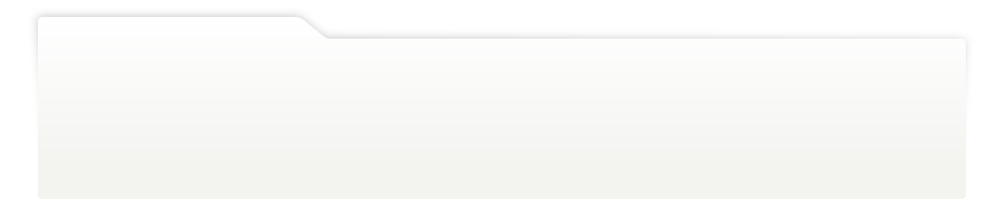
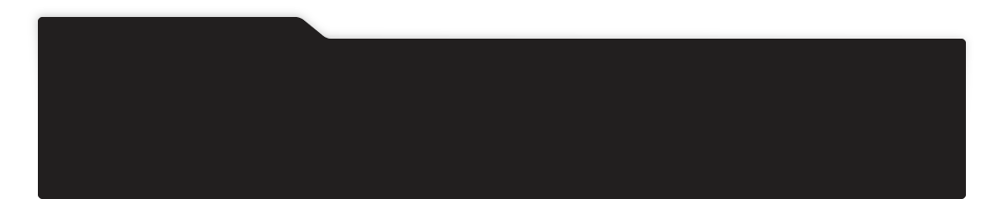
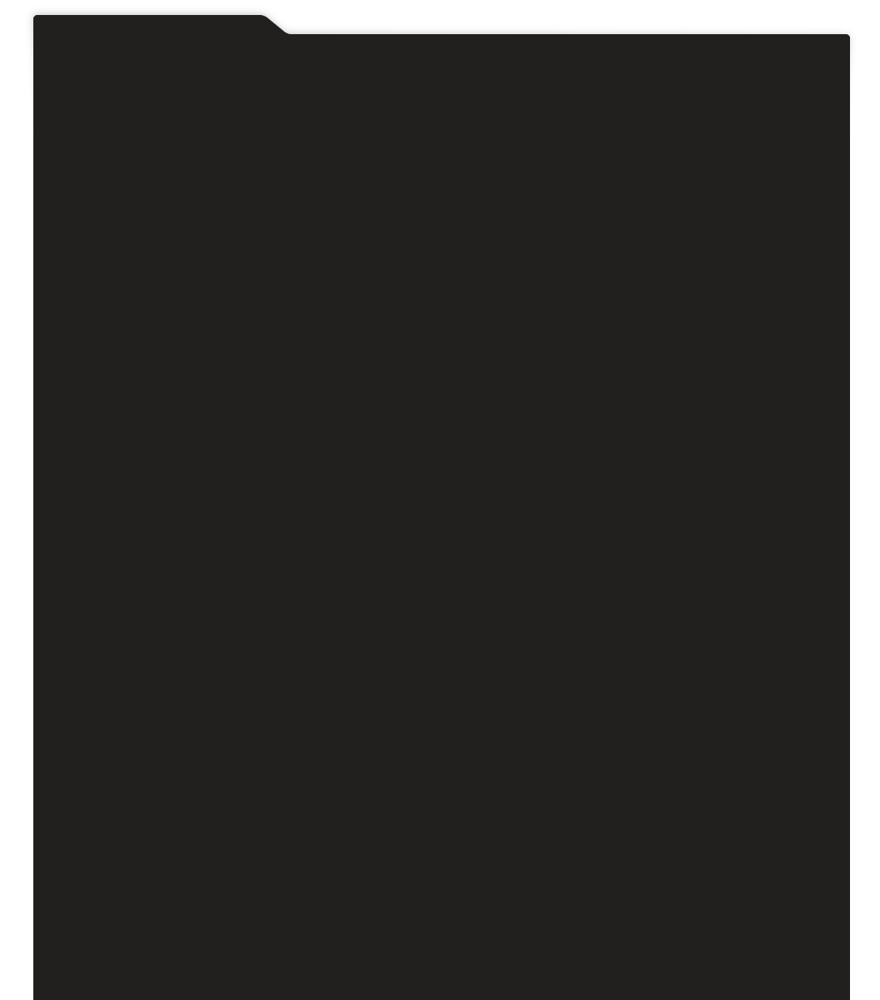
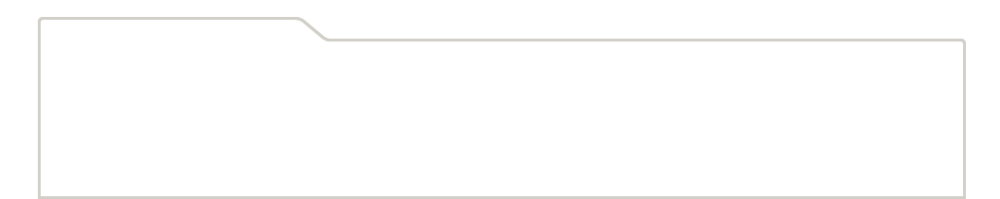
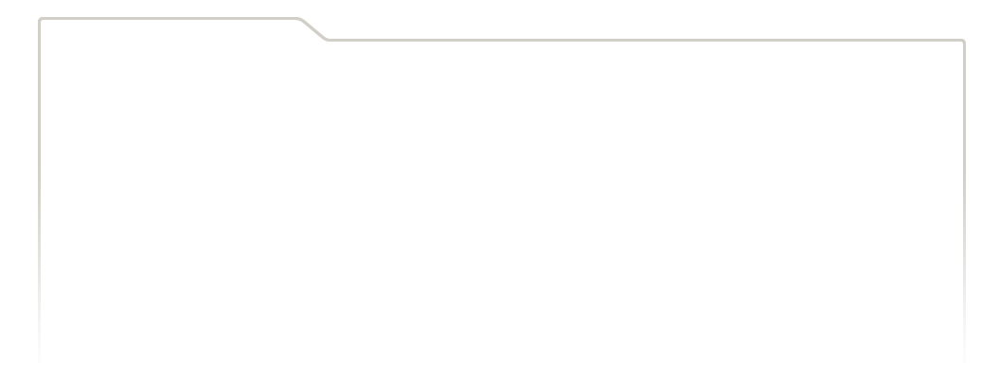
...
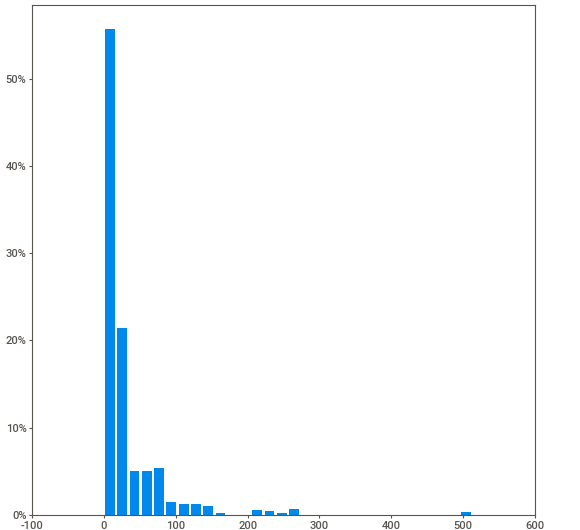
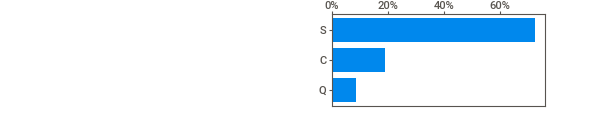
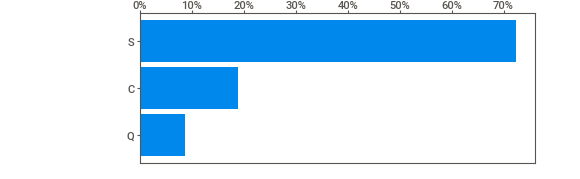
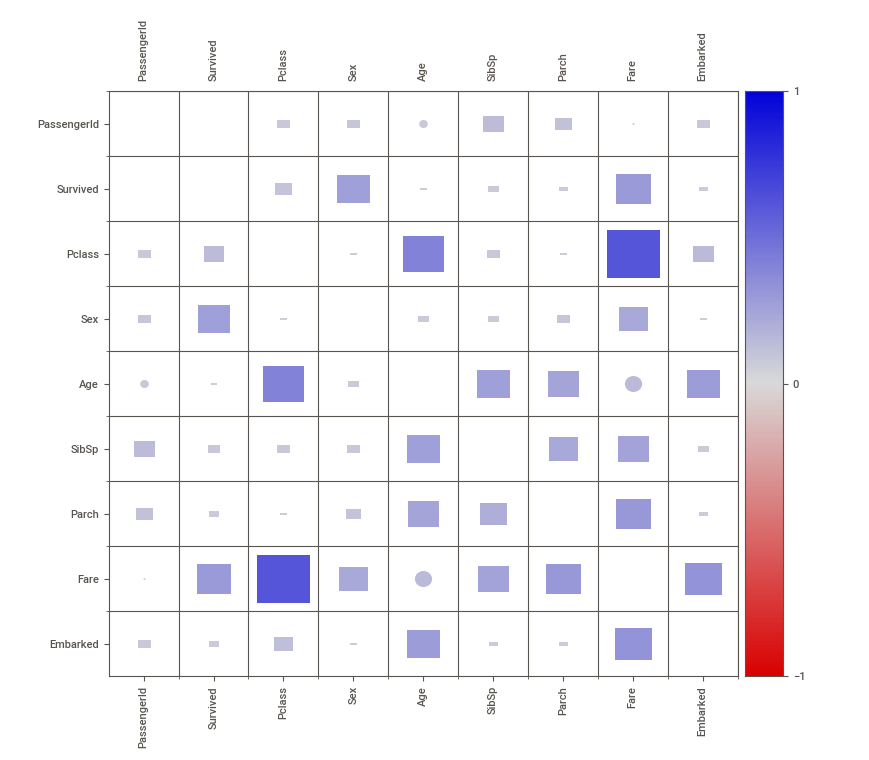
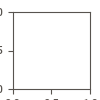

In [153]:
import sweetviz as sv
sv.config_parser.read("Override.ini")
my_report = sv.analyze(data_raw)
my_report.show_html(filepath='Basic_report.html', layout='vertical', scale=None)
my_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

Report Analyze_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



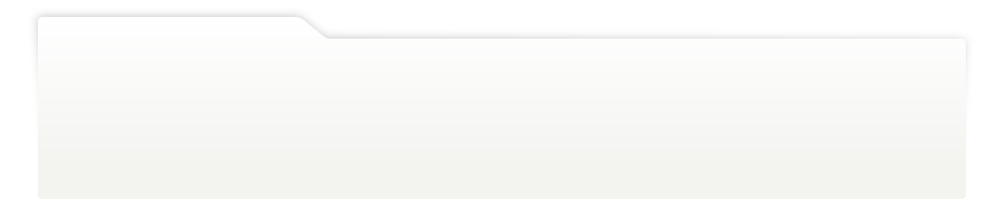
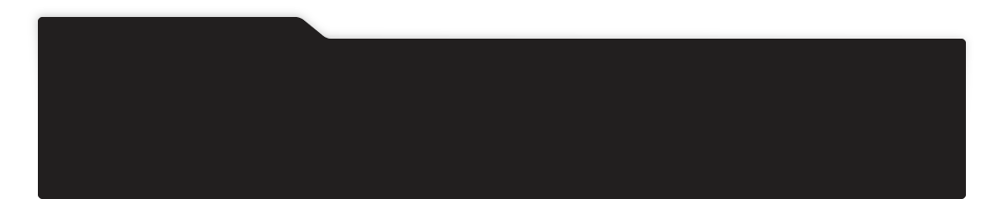
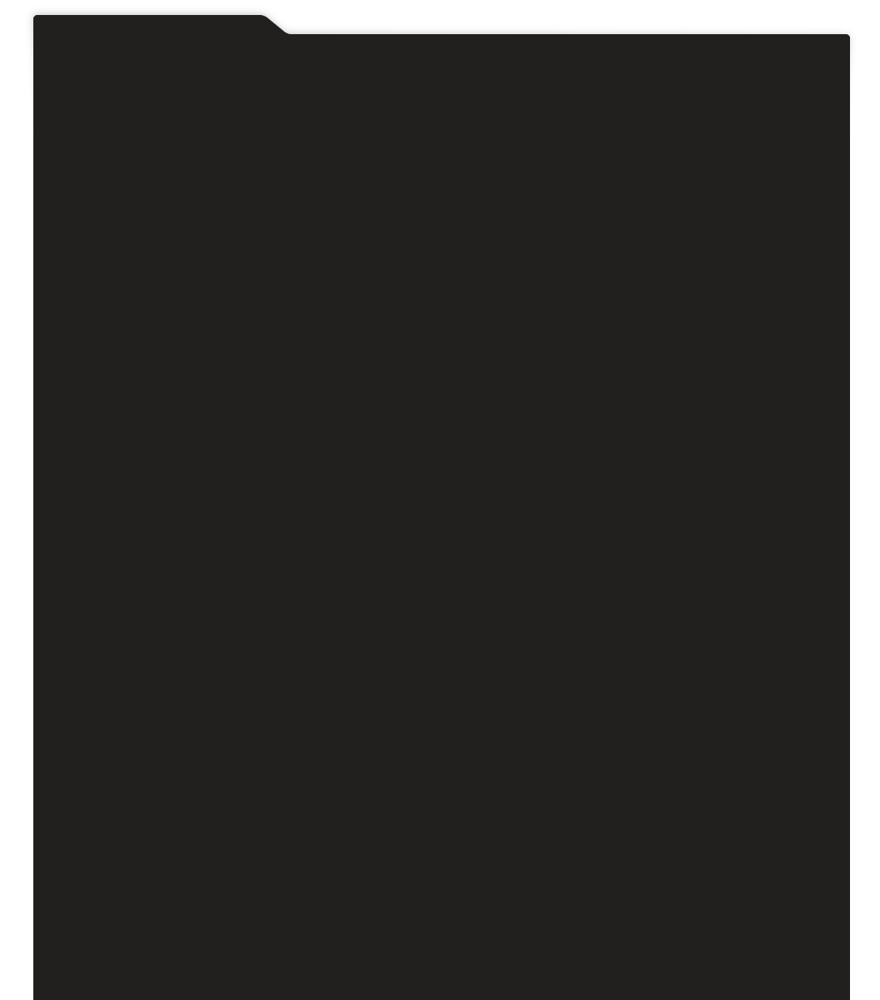
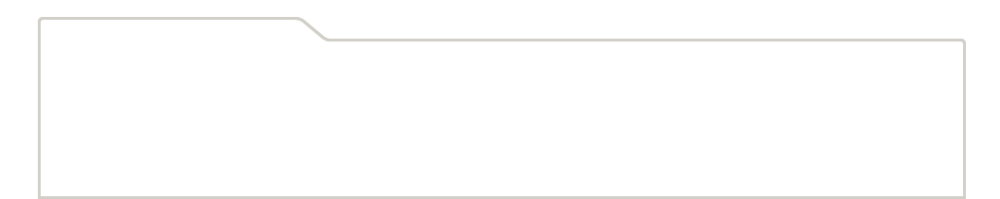
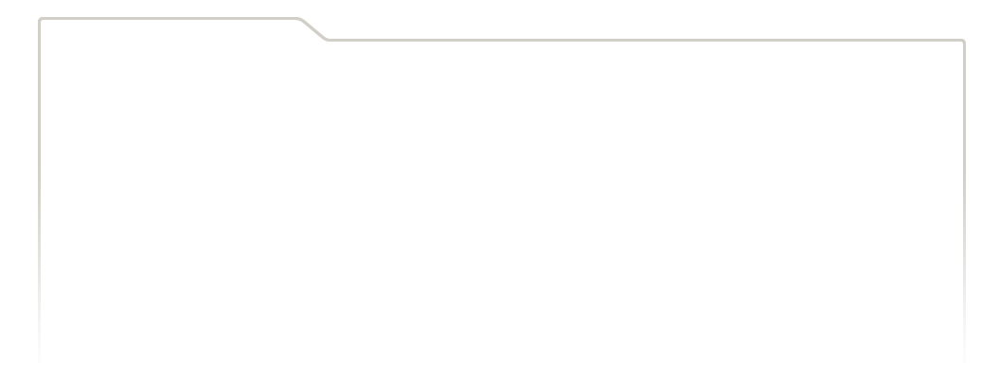
...
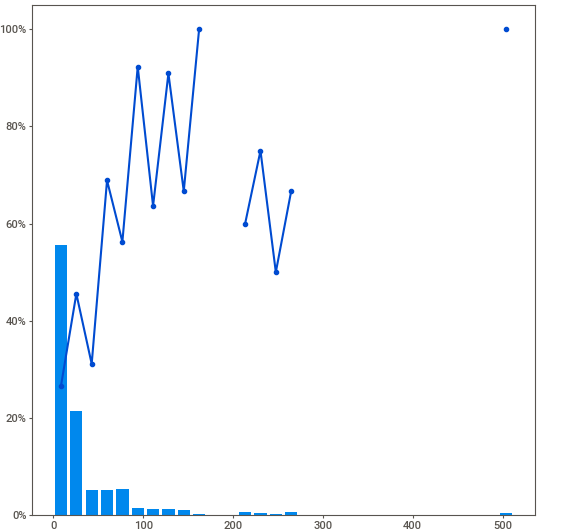
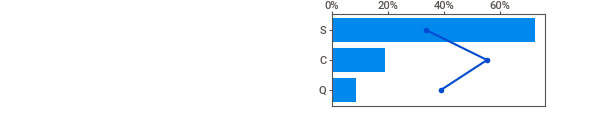
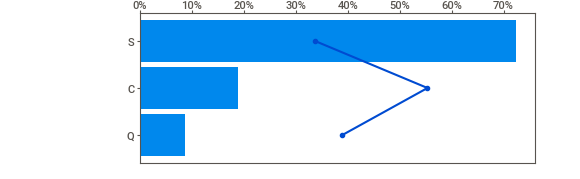
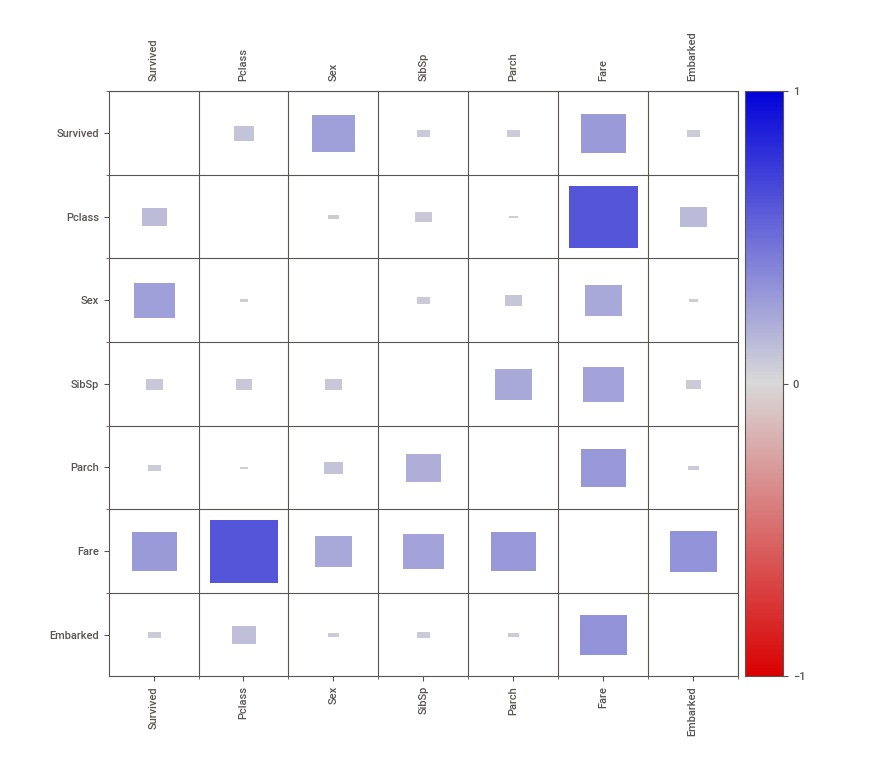
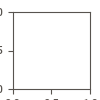

In [154]:
sv.config_parser.read("Override.ini")
feature_config = sv.FeatureConfig(skip="PassengerId", force_text=["Age"])
analyze_report = sv.analyze([data_raw,'Train'], 'Survived',  feature_config)
analyze_report.show_html(filepath='Analyze_report.html', layout='vertical', scale=None)
analyze_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

Report Compare_report_male_female.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



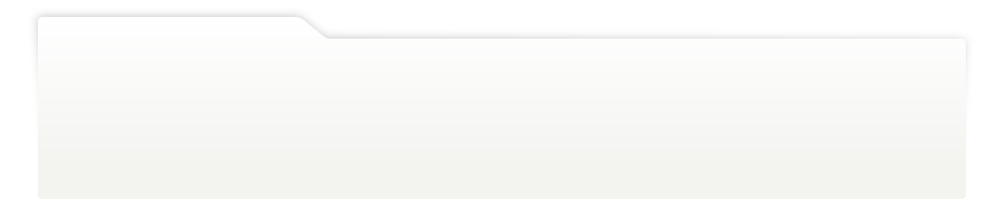
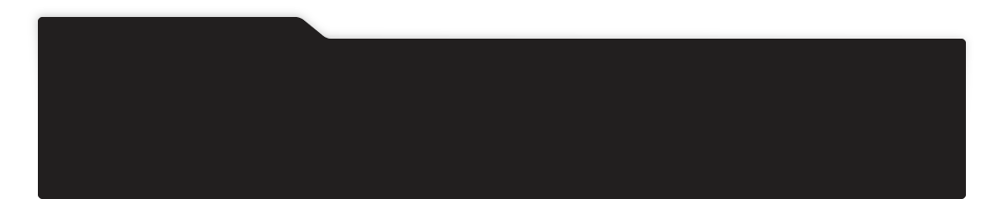
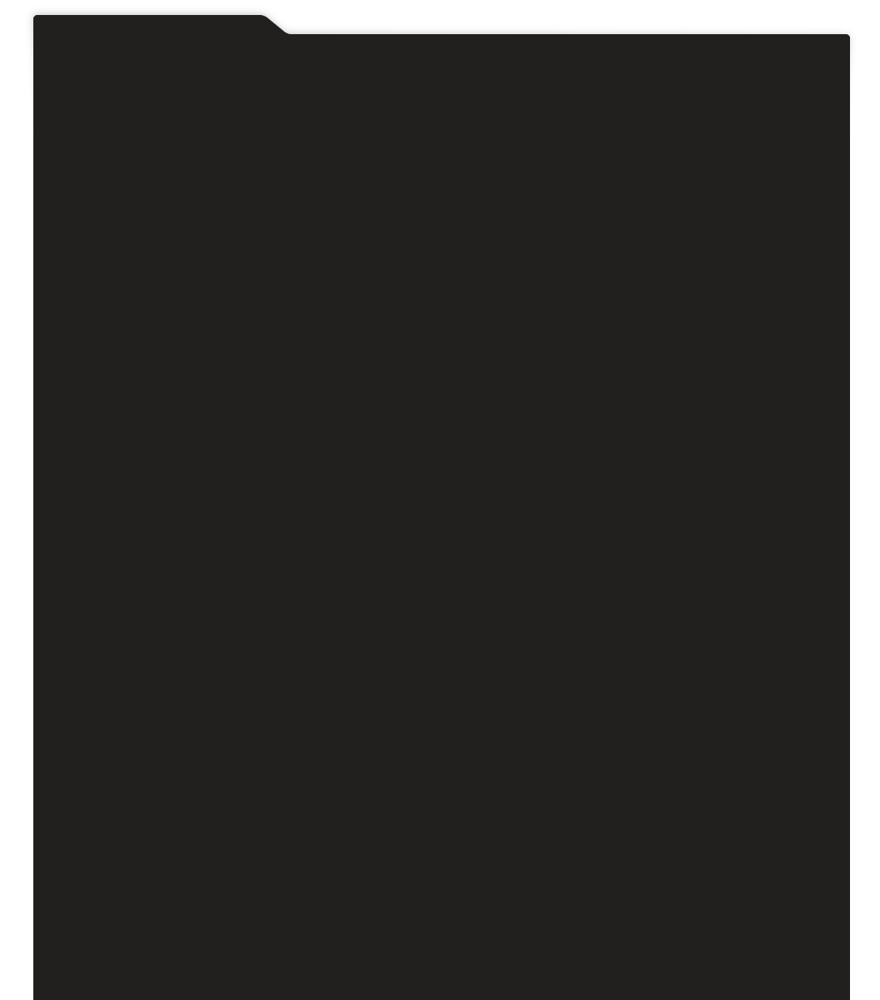
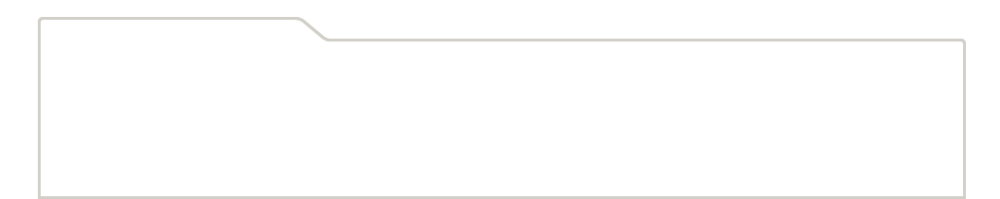
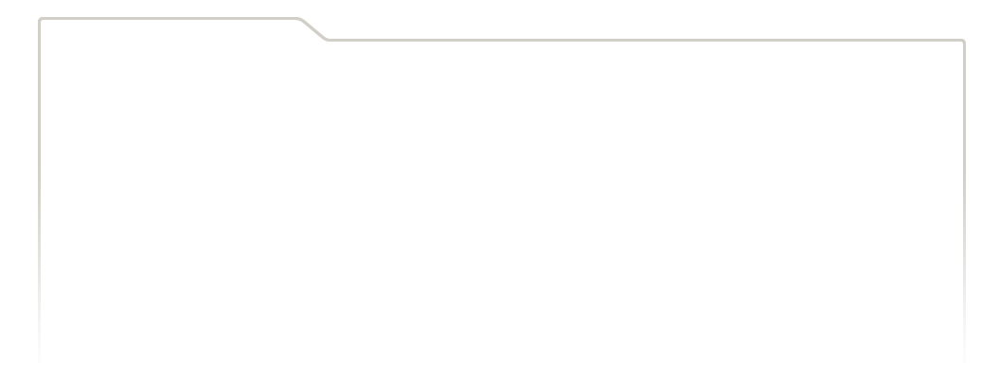
...
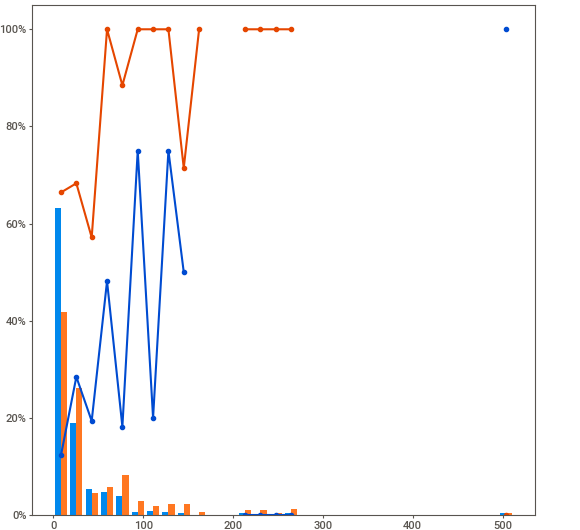
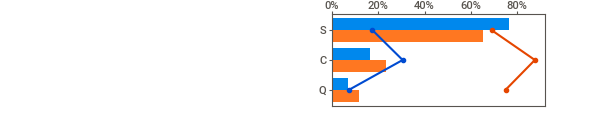
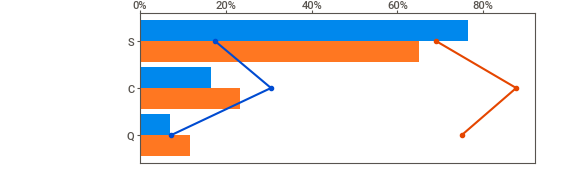
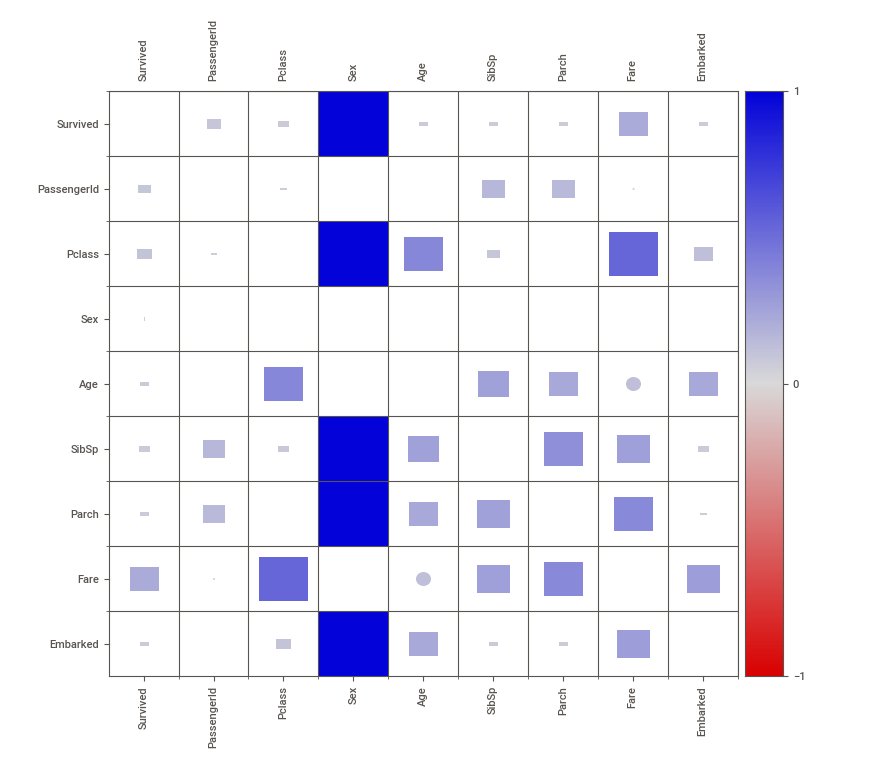
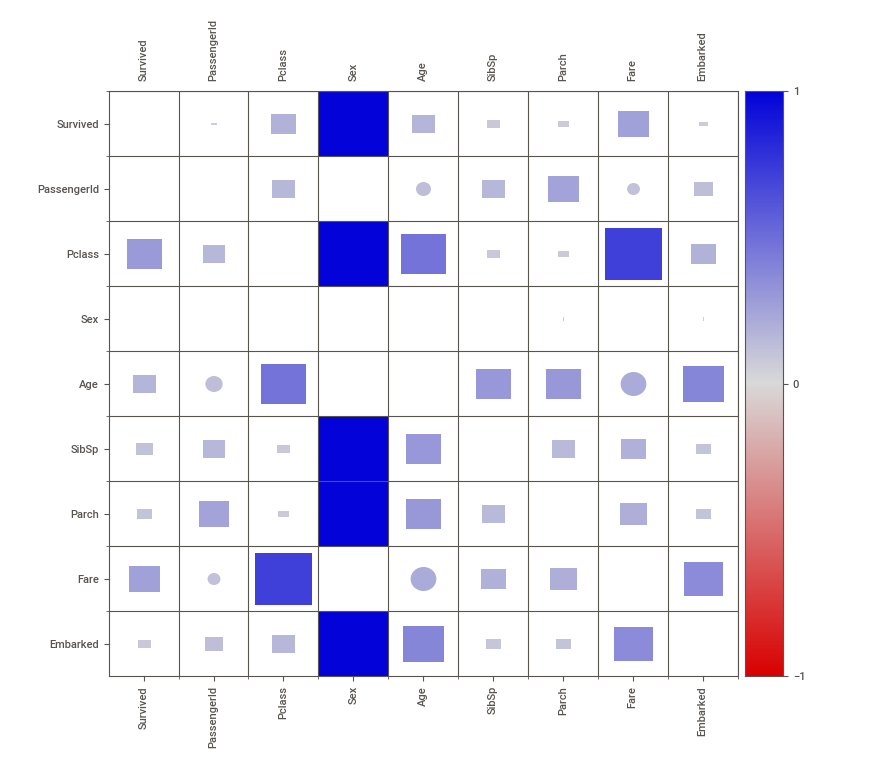

In [155]:
intra_report = sv.compare_intra(data_raw, data_raw["Sex"] == 'male', ["Male", "Female"], 'Survived')
intra_report.show_html(filepath='Compare_report_male_female.html', layout='vertical', scale=None)
intra_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

Report Compare_report_fare.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



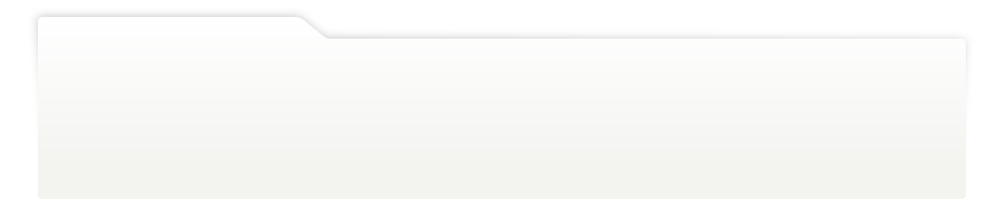
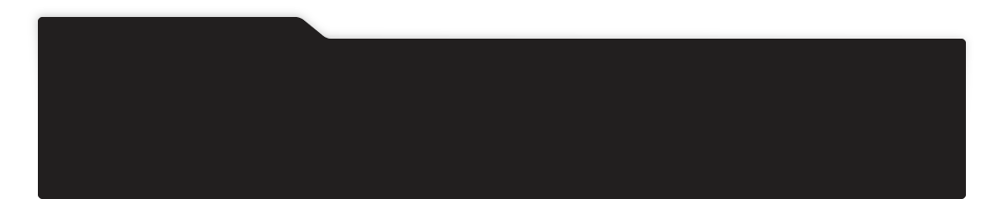
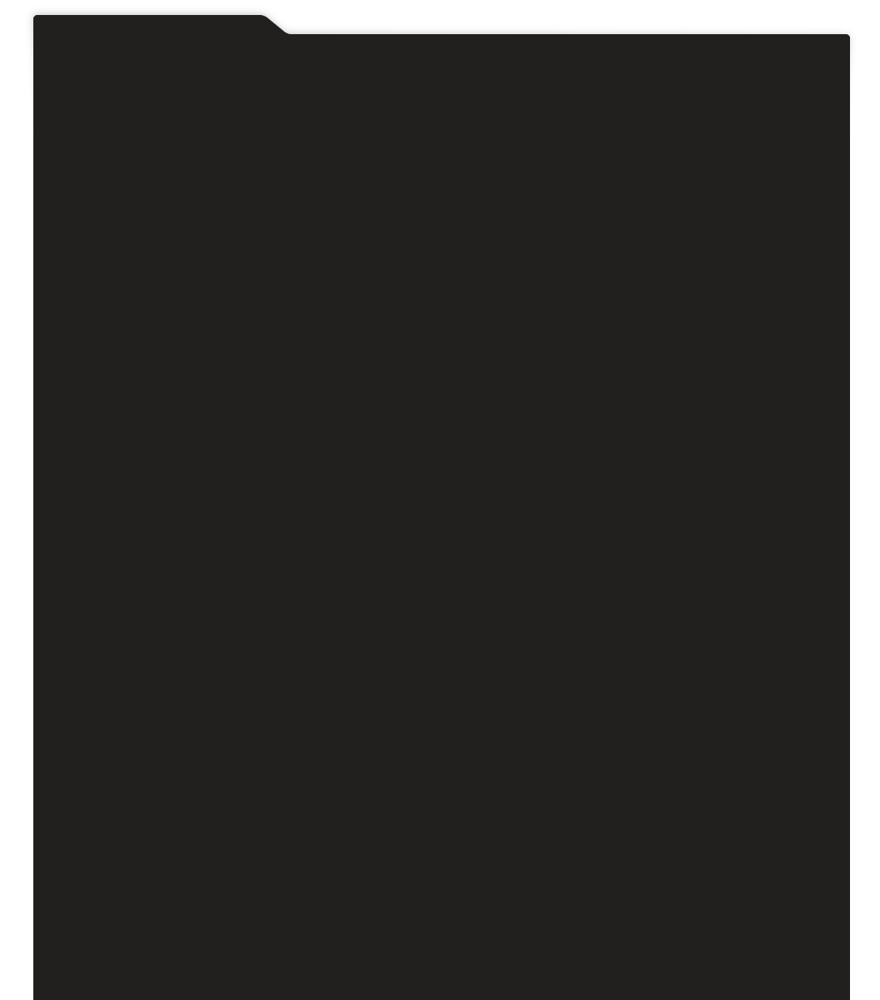
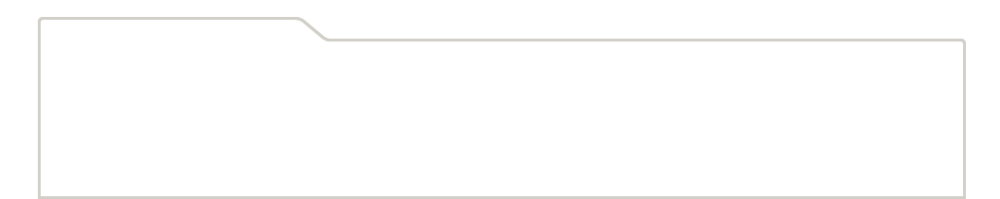
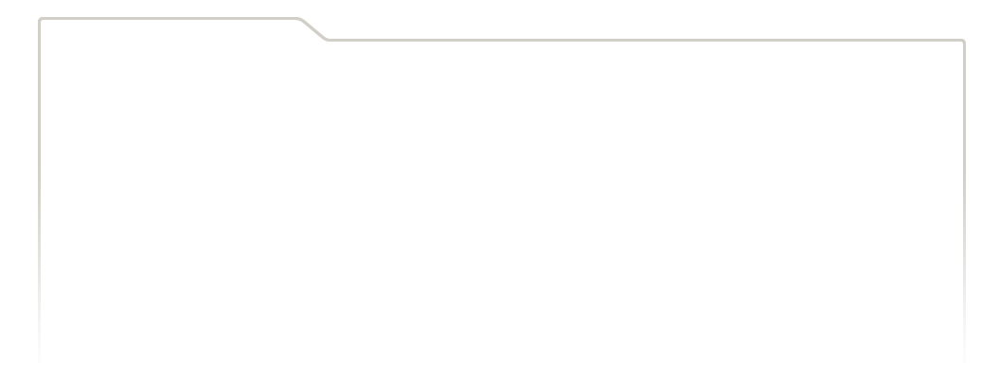
...
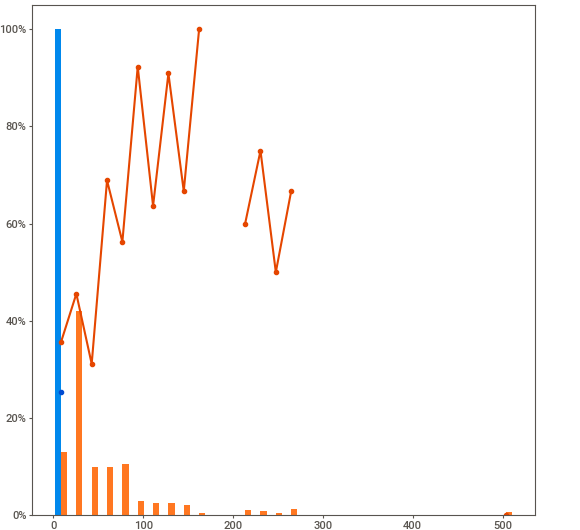
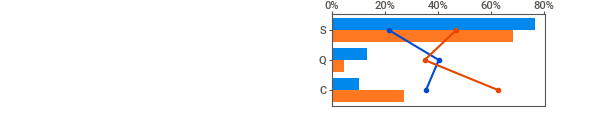
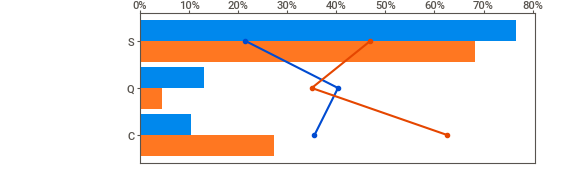
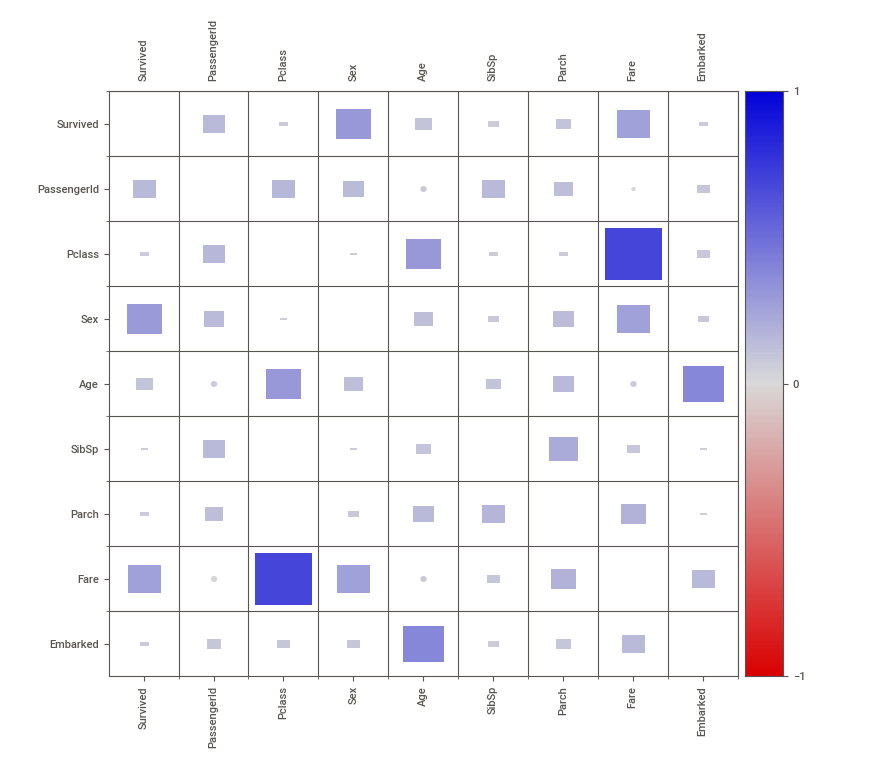
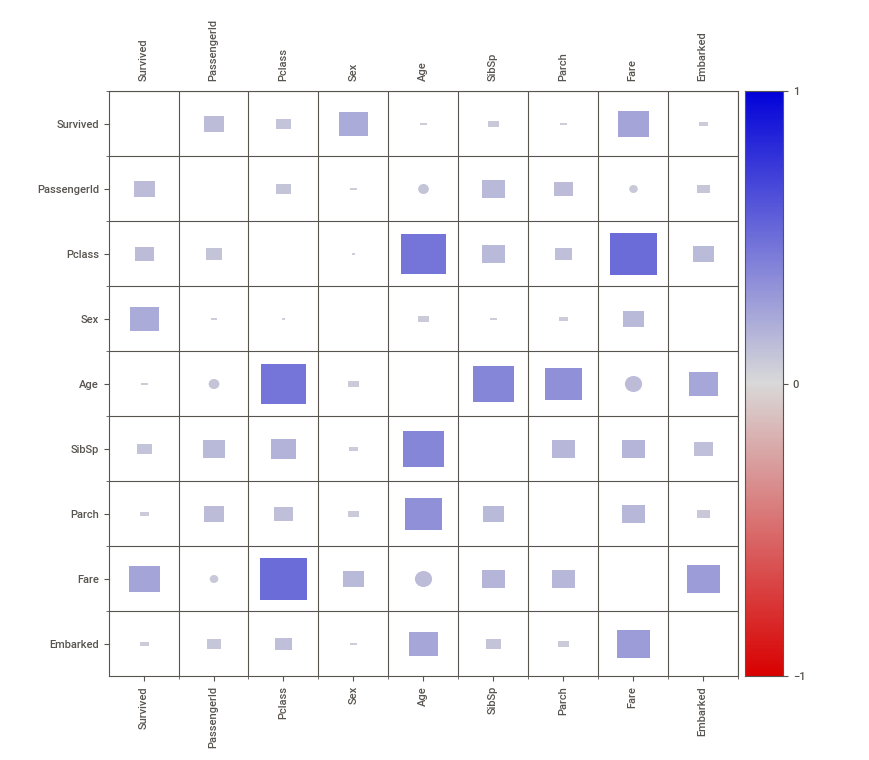

In [156]:
intra_report = sv.compare_intra(data_raw, data_raw["Fare"] <= 14, ["Low Fare", "High Fare"], 'Survived')
intra_report.show_html(filepath='Compare_report_fare.html', layout='vertical', scale=None)
intra_report.show_notebook()

In [157]:
import numpy as np
import matplotlib.pyplot as plt
import random
from matplotlib.ticker import ScalarFormatter, FixedLocator

#Training Parameters Preparation

In [158]:
data = data_raw.copy().drop(['Cabin','PassengerId','Ticket','Name', 'Embarked'], axis=1)

In [159]:
for row in range(len(data['Age'])):
  if np.isnan(data['Age'][row]):
     data['Age'][row] = random.uniform(13.5, 42.5)

In [160]:
data['Sex'].replace({'male':0, 'female':1},inplace=True)
#data['Embarked'] = data['Embarked'].fillna('S')
#data['Embarked'].replace({'S':0, 'C':1, 'Q':2},inplace=True)

#Leaving 'Embarked' showed better acc on test data (0.8577) but worse on actual data

In [161]:
data.head()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare
0,0,3,0,22,1,0,7
1,1,1,1,38,1,0,71
2,1,3,1,26,0,0,8
3,1,1,1,35,1,0,53
4,0,3,0,35,0,0,8


In [162]:
# Counting 100% data records per column
total_no_of_data = len(data['Survived'])
total_no_of_data

891

In [163]:
# Identify columns with any N/A values in 'data' dataframe
na_cols = (data.isna().sum() > 0)

# Calculate the number of N/A values per column
na_counts = data.isna().sum()

# Calculate the percentage of N/A values per column
na_percentage = (na_counts /total_no_of_data) * 100

# Create a DataFrame with columns and their N/A count and percentage
na_summary = pd.DataFrame({
    'N/A Count': na_counts,
    'N/A Percentage': na_percentage
})

# Include columns with 0 N/A in the summary and sort values
na_summary_sorted = na_summary.sort_values(by='N/A Count', ascending=False)

# Display the result
na_summary_sorted

,N/A Count,N/A Percentage
Survived,0,0
Pclass,0,0
Sex,0,0
Age,0,0
SibSp,0,0
Parch,0,0
Fare,0,0


In [164]:
# Displaying only numerical values from the dataframe 'Final_task2'
pd.options.display.float_format = '{:,.0f}'.format
# Display numerical values from the DataFrame
numerical_data = data.select_dtypes(include='number')
numerical_data.describe()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare
count,891,891,891,891,891,891,891
mean,0,2,0,29,1,0,32
std,0,1,0,14,1,1,50
min,0,1,0,0,0,0,0
25%,0,2,0,20,0,0,8
50%,0,3,0,28,0,0,14
75%,1,3,1,37,1,0,31
max,1,3,1,80,8,6,512


In [165]:
import pandas as pd

# Assuming 'data' is your DataFrame and it's already loaded

selected_columns = ['Survived', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare']
data_corelation = data[selected_columns].copy()

correlation_matrix = data_corelation.corr(method='spearman')

# Round the values in the correlation matrix to 2 decimal places
correlation_matrix_rounded = correlation_matrix.round(2)

print(correlation_matrix_rounded)

          Survived  Pclass  Sex  Age  SibSp  Parch  Fare
Survived         1      -0    1   -0      0      0     0
Pclass          -0       1   -0   -0     -0     -0    -1
Sex              1      -0    1   -0      0      0     0
Age             -0      -0   -0    1     -0     -0     0
SibSp            0      -0    0   -0      1      0     0
Parch            0      -0    0   -0      0      1     0
Fare             0      -1    0    0      0      0     1


In [166]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    int64  
 3   Age       891 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
dtypes: float64(2), int64(5)
memory usage: 48.9 KB


#Heatmap

In [167]:
import seaborn as sns

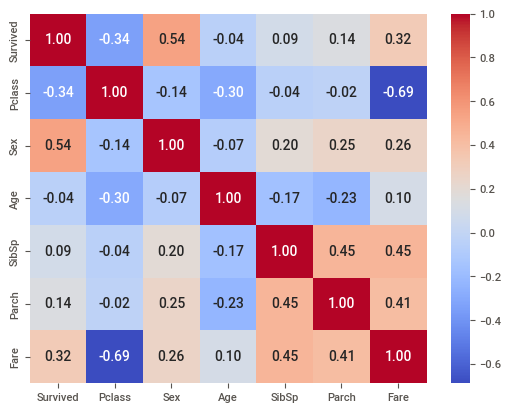

In [168]:
# Heatmap plot
sns.heatmap(correlation_matrix, fmt=".2f", annot=True, cmap='coolwarm')
plt.show()

#Plots

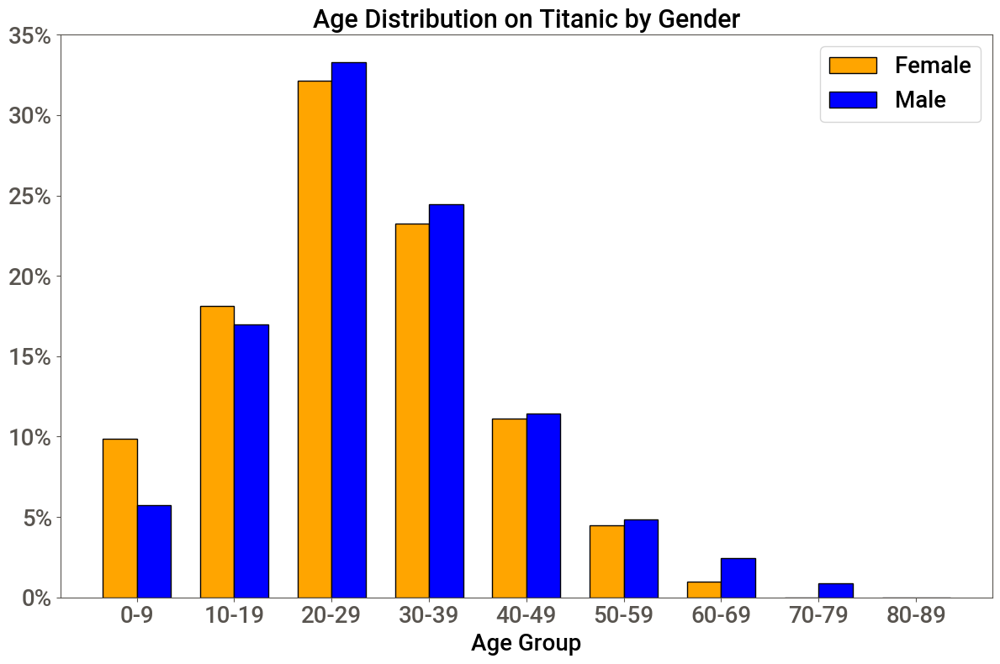

In [169]:
import matplotlib.pyplot as plt
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

# Define the age bins
bins = range(0, 91, 10)  # 0, 10, 20, ..., 90

# Compute the frequency distribution of ages for each gender
age_gender_counts = data.groupby(['Sex', pd.cut(data['Age'], bins)]).size().unstack(fill_value=0)

# Convert frequencies to percentages
total_counts_gender = age_gender_counts.sum(axis=1)
age_gender_percentages = (age_gender_counts.T / total_counts_gender).T * 100

# Plotting the data
plt.figure(figsize=(12, 8))

# Create separate bar plots for each gender
width = 0.35  # Bar width
ind = range(len(bins) - 1)  # Indices for the bars

# Plot for females (coded as 1, changed to orange)
plt.bar([x - width/2 for x in ind], age_gender_percentages.loc[1], width=width, edgecolor='k', color='orange', label='Female')

# Plot for males (coded as 0, changed to blue)
plt.bar([x + width/2 for x in ind], age_gender_percentages.loc[0], width=width, edgecolor='k', color='blue', label='Male')

# Get current Axes object
ax = plt.gca()

# Function to add % sign to y-axis values
def percent_formatter(x, pos):
    return f'{x:.0f}%'

# Format y-axis values to show percentages
ax.yaxis.set_major_formatter(plt.FuncFormatter(percent_formatter))

# Set x-axis and y-axis tick parameters
ax.tick_params(axis='both', which='major', labelsize=20)

# Set y-axis ticks at every 5%
ax.set_yticks(range(0, 40, 5))

# Set x-axis ticks and labels
ax.set_xticks(ind)
ax.set_xticklabels([f'{bins[i]}-{bins[i+1]-1}' for i in range(len(bins)-1)])

# Set x-axis label with bold font weight and dark black color
ax.set_xlabel('Age Group', fontweight='bold', fontsize=20, color='black')

plt.title('Age Distribution on Titanic by Gender', fontweight='bold', fontsize=22)

# Add legend
plt.legend(fontsize=20)

# Tight layout for better spacing
plt.tight_layout()

plt.show()


In [170]:
# For 'Sex' == 1
data_sex_1 = data[data['Sex'] == 1]
age_sex_1_stats = data_sex_1['Age'].describe()

# For 'Sex' == 0
data_sex_0 = data[data['Sex'] == 0]
age_sex_0_stats = data_sex_0['Age'].describe()

In [171]:
age_sex_1_stats

count   314
mean     28
std      13
min       1
25%      19
50%      27
75%      36
max      63
Name: Age, dtype: float64

In [172]:
age_sex_0_stats

count   577
mean     30
std      14
min       0
25%      21
50%      29
75%      37
max      80
Name: Age, dtype: float64

In [173]:
# For 'Sex' == 1
fare_sex_1_stats = data_sex_1['Fare'].describe()

# For 'Sex' == 0
fare_sex_0_stats = data_sex_0['Fare'].describe()

In [175]:
fare_sex_1_stats

count   314
mean     44
std      58
min       7
25%      12
50%      23
75%      55
max     512
Name: Fare, dtype: float64

In [174]:
fare_sex_0_stats

count   577
mean     26
std      43
min       0
25%       8
50%      10
75%      27
max     512
Name: Fare, dtype: float64

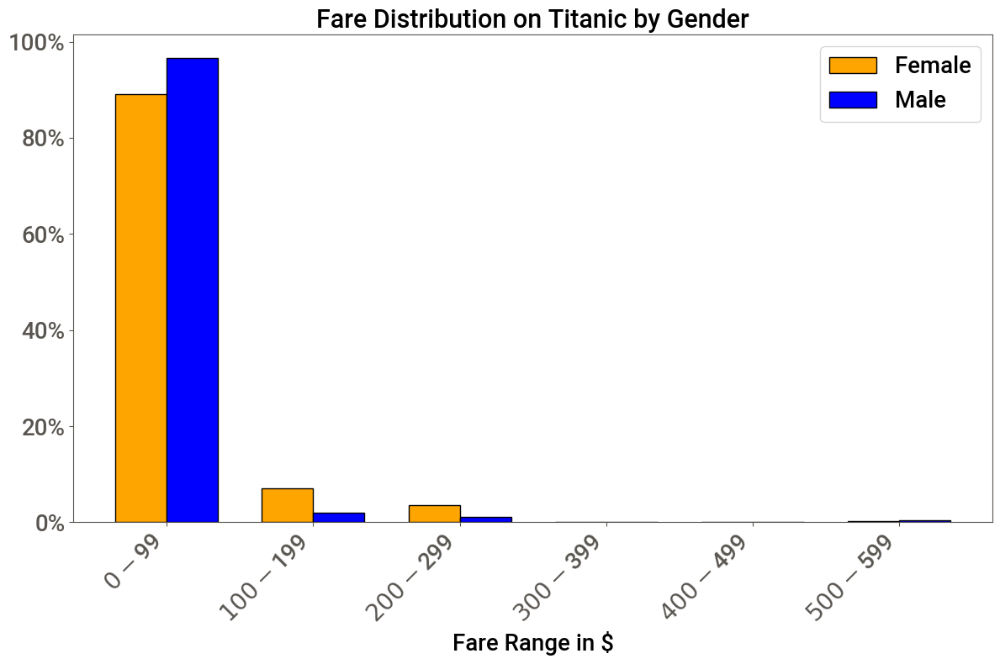

In [176]:
import matplotlib.pyplot as plt
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

# Define the fare bins
fare_bins = range(0, 601, 100)  # 0, 100, 200, ..., 500, 600

# Compute the frequency distribution of fares for each gender
fare_gender_counts = data.groupby(['Sex', pd.cut(data['Fare'], fare_bins)]).size().unstack(fill_value=0)

# Convert frequencies to percentages
total_counts_fare = fare_gender_counts.sum(axis=1)
fare_gender_percentages = (fare_gender_counts.T / total_counts_fare).T * 100

# Plotting the data
plt.figure(figsize=(12, 8))

# Create separate bar plots for each gender
width = 0.35  # Bar width
ind = range(len(fare_gender_percentages.columns))  # Indices for the bars

# Plot for females (orange)
plt.bar([x - width/2 for x in ind], fare_gender_percentages.loc[1], width=width, edgecolor='k', color='orange', label='Female')

# Plot for males (blue)
plt.bar([x + width/2 for x in ind], fare_gender_percentages.loc[0], width=width, edgecolor='k', color='blue', label='Male')

# Get current Axes object
ax = plt.gca()

# Function to add % sign to y-axis values
def percentage_formatter(x, pos):
    return f'{int(x)}%'

# Format y-axis values to show percentages
ax.yaxis.set_major_formatter(plt.FuncFormatter(percentage_formatter))

# Set x-axis and y-axis tick parameters
ax.tick_params(axis='both', which='major', labelsize=20)

# Set x-axis ticks and labels
ax.set_xticks(ind)
ax.set_xticklabels([f'${fare_bins[i]}-${fare_bins[i+1]-1}' for i in range(len(fare_bins)-1)], rotation=45, ha='right')

# Set x-axis label
ax.set_xlabel('Fare Range in $', fontweight='bold', fontsize=20, color='black')

plt.title('Fare Distribution on Titanic by Gender', fontweight='bold', fontsize=22)

# Add legend
plt.legend(fontsize=20)

# Tight layout for better spacing
plt.tight_layout()

plt.show()

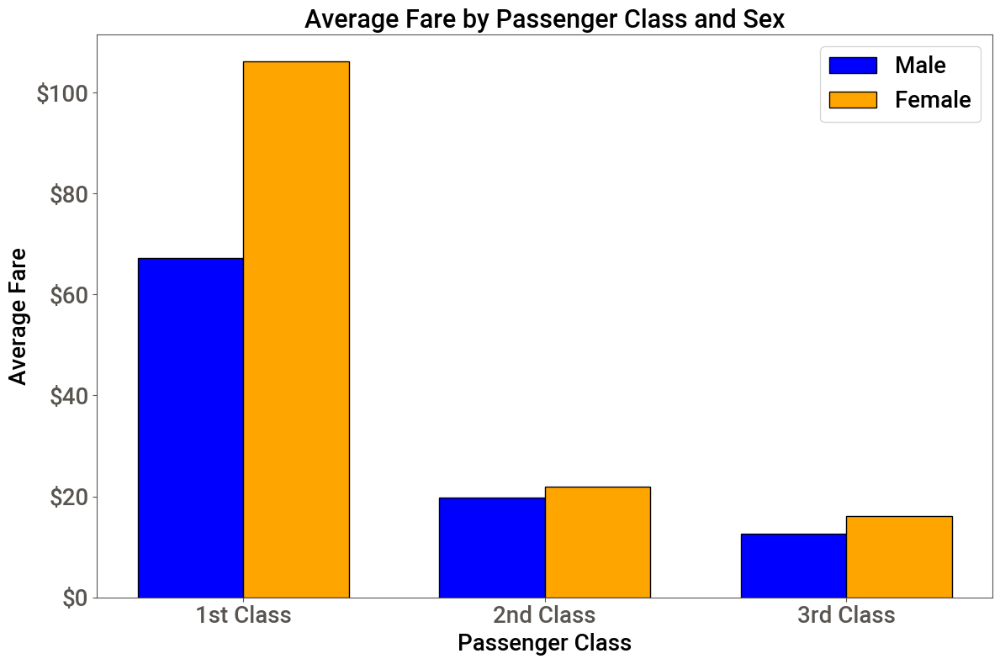

In [177]:
import matplotlib.pyplot as plt
import pandas as pd
import warnings

warnings.filterwarnings('ignore')

# Assuming data is already loaded into a DataFrame named 'data'
# Compute the average Fare for each combination of Pclass and Sex
fare_class_sex_averages = data.groupby(['Pclass', 'Sex'])['Fare'].mean().unstack()

# Plotting the data
plt.figure(figsize=(12, 8))

# Number of Passenger Classes
num_classes = len(fare_class_sex_averages.index)
num_sexes = len(fare_class_sex_averages.columns)

# Indices for the bars
ind = range(1, num_classes + 1)

# Bar width
width = 0.35

# Plot the average fare for each class and sex
p1 = plt.bar([i - width/2 for i in ind], fare_class_sex_averages[0], width, edgecolor='k', color='blue', label='Male')
p2 = plt.bar([i + width/2 for i in ind], fare_class_sex_averages[1], width, edgecolor='k', color='orange', label='Female')

# Get current Axes object
ax = plt.gca()

# Set y-axis formatter to display the fare
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, pos: f'${x:.0f}'))

# Set x-axis and y-axis tick parameters
ax.tick_params(axis='both', which='major', labelsize=20)

# Set x-axis ticks and labels
ax.set_xticks(ind)
ax.set_xticklabels(['1st Class', '2nd Class', '3rd Class'])

# Set x-axis label with bold font weight and dark black color
ax.set_xlabel('Passenger Class', fontweight='bold', fontsize=20, color='black')

# Set y-axis label with bold font weight and dark black color
ax.set_ylabel('Average Fare', fontweight='bold', fontsize=20, color='black')

plt.title('Average Fare by Passenger Class and Sex', fontweight='bold', fontsize=22)

# Add legend
plt.legend(fontsize=20)


# Tight layout for better spacing
plt.tight_layout()

plt.show()


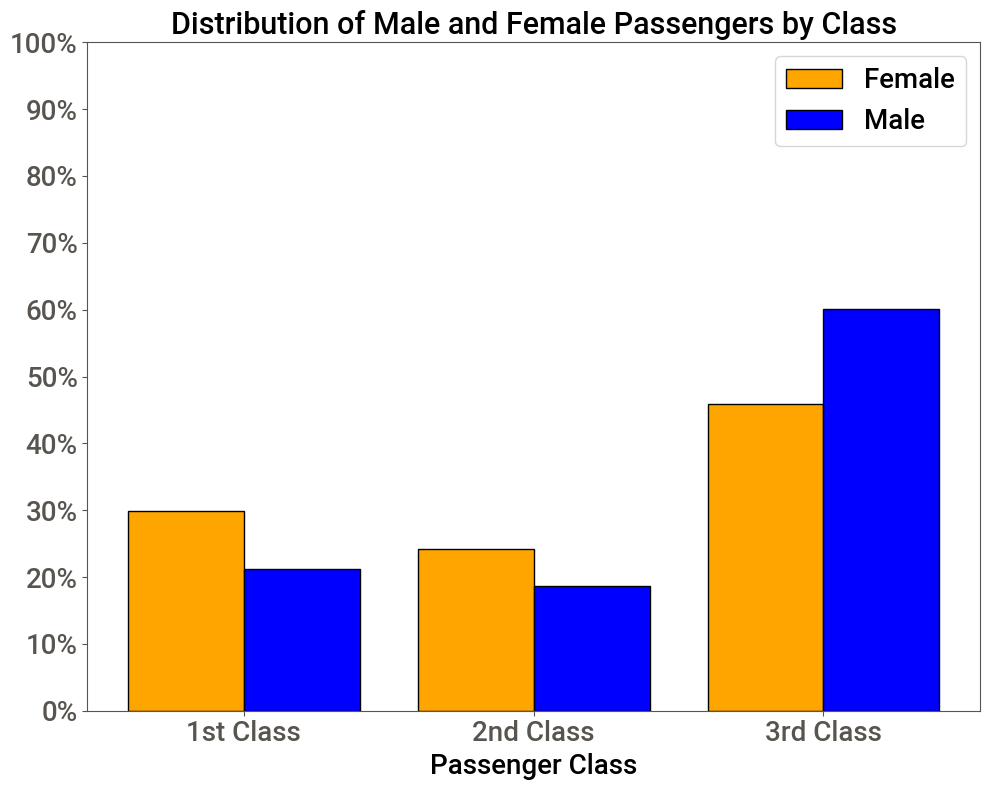

In [178]:
import matplotlib.pyplot as plt
import pandas as pd
import warnings

warnings.filterwarnings('ignore')


# Compute the frequency distribution of males and females for each Pclass
gender_class_counts = data.groupby(['Sex', 'Pclass']).size().unstack(fill_value=0)

# Convert frequencies to percentages
total_counts_gender = gender_class_counts.sum(axis=1)
gender_class_percentages = (gender_class_counts.T / total_counts_gender).T * 100

# Plotting the data
plt.figure(figsize=(10, 8))

# Number of Passenger Classes
num_classes = len(gender_class_percentages.columns)

# Create separate bar plots for each gender
width = 0.4  # Bar width
ind = range(1, num_classes + 1)  # Indices for the bars

# Plot for females (changed to orange)
plt.bar([x - width/2 for x in ind], gender_class_percentages.loc[1], width=width, edgecolor='k', color='orange', label='Female')

# Plot for males (changed to blue)
plt.bar([x + width/2 for x in ind], gender_class_percentages.loc[0], width=width, edgecolor='k', color='blue', label='Male')

# Get current Axes object
ax = plt.gca()

# Function to add % sign to y-axis values
def percent_formatter(x, pos):
    return f'{x:.0f}%'

# Format y-axis values to show percentages
ax.yaxis.set_major_formatter(plt.FuncFormatter(percent_formatter))

# Set x-axis and y-axis tick parameters
ax.tick_params(axis='both', which='major', labelsize=20)

# Set y-axis ticks at every 10%
ax.set_yticks(range(0, 110, 10))

# Set x-axis ticks and labels
ax.set_xticks(ind)
ax.set_xticklabels(['1st Class', '2nd Class', '3rd Class'])

# Set x-axis label with bold font weight and dark black color
ax.set_xlabel('Passenger Class', fontweight='bold', fontsize=20, color='black')

plt.title('Distribution of Male and Female Passengers by Class', fontweight='bold', fontsize=22)

# Add legend
plt.legend(fontsize=20)

# Tight layout for better spacing
plt.tight_layout()

plt.show()

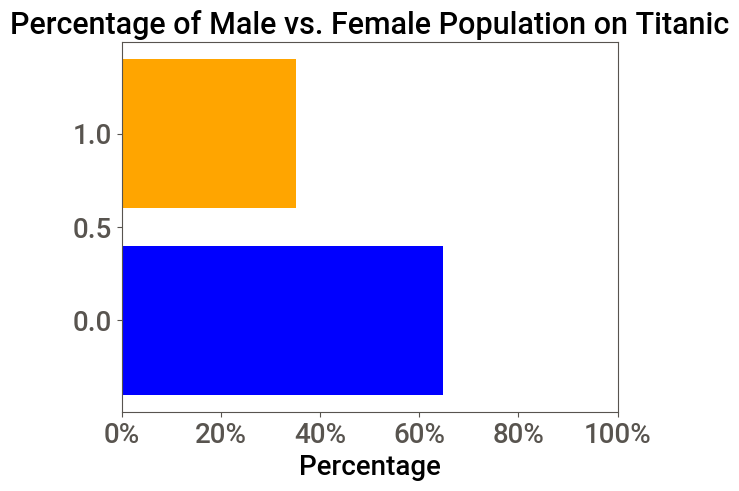

In [179]:
import matplotlib.pyplot as plt

# Compute the frequency distribution of males and females
gender_counts = data['Sex'].value_counts()

# Convert frequencies to percentages
total_counts = gender_counts.sum()
gender_percentages = (gender_counts / total_counts) * 100

# Assuming gender_class_percentages has columns ['Male', 'Female'] with calculated percentages
male_percentage = gender_percentages.loc[0].sum()  # Sum of male percentages across all classes
female_percentage = gender_percentages.loc[1].sum()  # Sum of female percentages across all classes

percentages = [male_percentage, female_percentage]

categories =[0,1]
# Create the plot
fig, ax = plt.subplots()

# Plotting
bars = ax.barh(categories,percentages, color=['blue', 'orange'])

# Set x-axis and y-axis tick parameters
ax.tick_params(axis='both', which='major', labelsize=20)

# Set x-axis tick parameters for percentage
ax.set_xticks(range(0, 101, 20))  # Set ticks at 0, 20, 40, ..., 100
ax.set_xlim(0, 100)  # Set limit from 0 to 100

# Format x-axis tick labels as percentages
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{int(x)}%'))

# Set y-axis and x-axis labels and title
ax.set_xlabel('Percentage', fontweight='bold', fontsize=20, color='black')
ax.set_title('Percentage of Male vs. Female Population on Titanic', fontweight='bold', fontsize=22)

# Display the plot
plt.show()

In [180]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt

#Decision Tree

In [181]:
import pandas as pd
from imblearn.over_sampling import SMOTE
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.metrics import confusion_matrix,  classification_report
import matplotlib.pyplot as plt

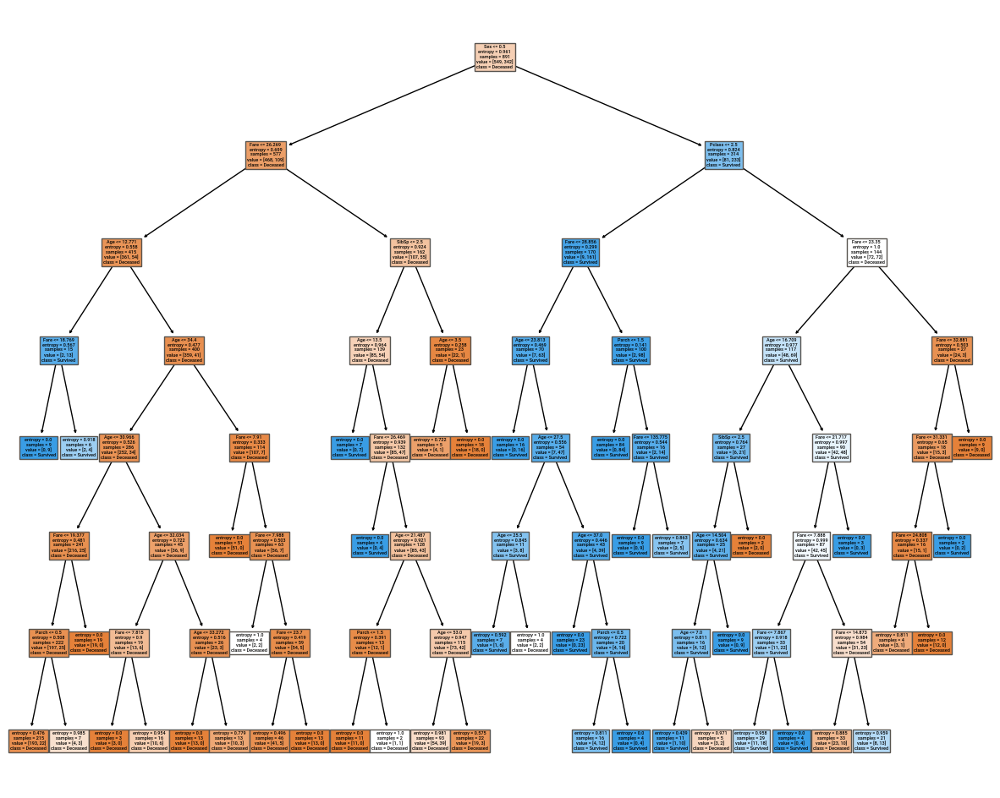

In [182]:
# Creating an instance of our decision tree
tree = DecisionTreeClassifier(max_depth = 7,
                              min_samples_leaf = 2,
                              min_samples_split = 8,
                              criterion = 'entropy')
                              #max_features = 'sqrt')

data_test = data.copy().drop(['Survived'], axis=1)
tree.fit(data_test.loc[:,:],data.Survived)
predictions = tree.predict(data_test.loc[:,:])

plt.subplots(figsize = (15,12))
plot_tree(tree,
          feature_names = tree.feature_names_in_,
          class_names = ['Deceased', 'Survived'],
          filled = True)
plt.show()

##Is Decision Tree Model good?

In [187]:
# Calculate accuracy
accuracy = accuracy_score(data['Survived'], predictions)
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 85.52%


In [188]:
# Create and train the model
tree = DecisionTreeClassifier()
tree.fit(X, y)

# Access feature importances
importances = tree.feature_importances_

# Get feature names
feature_names = X.columns

# Print feature importances
for i, importance in enumerate(importances):
    print(f"Feature {feature_names[i]}: {importance:.3f}")


Feature Pclass: 0.107
Feature Sex: 0.303
Feature Age: 0.260
Feature SibSp: 0.056
Feature Parch: 0.030
Feature Fare: 0.243


In [190]:
# Printing the classification report
print(classification_report(data['Survived'], predictions))

              precision    recall  f1-score   support

           0       0.84      0.95      0.89       549
           1       0.89      0.71      0.79       342

    accuracy                           0.86       891
   macro avg       0.87      0.83      0.84       891
weighted avg       0.86      0.86      0.85       891



In [191]:
cm_data = pd.concat([
    pd.Series(data.Survived, name = 'Actual'),
    pd.Series(predictions, name = 'Predicted')], axis = 1)
cm_data

,Actual,Predicted
0,0,0
1,1,1
2,1,0
3,1,1
4,0,0
...,...,...
886,0,0
887,1,1
888,0,0
889,1,0


In [192]:
pd.crosstab(cm_data['Actual'],cm_data['Predicted'])

Predicted,0,1
Actual,,
0,520,29
1,100,242


In [193]:
print(f'Precision 1: {222/(222+17):.2f}')
print(f'Recall 1: {222/(222+120):.2f}')

print(f'Precision 0: {532/(532+120):.2f}')
print(f'Recall 0: {532/(532+17):.2f}')

Precision 1: 0.93
Recall 1: 0.65
Precision 0: 0.82
Recall 0: 0.97


##Decision Tree Hyper Parameters Tuning

###GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV

tree_GS = DecisionTreeClassifier()

param_grid = {'max_depth': [4, 5, 6, 7],
              'min_samples_split': [4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15],
              'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'criterion': ["entropy","gini"]}

grid_search = GridSearchCV(tree_GS, param_grid=param_grid, cv=5)

grid_search.fit(data_test.loc[:,:],data.Survived)

# Print the best parameters and score
print('Best Parameters:', grid_search.best_params_)
print('Best Score:', grid_search.best_score_)

Best Parameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 6, 'min_samples_split': 4}
Best Score: 0.8338899001945892


In [ ]:
from sklearn.model_selection import RandomizedSearchCV

param_dist = {"max_depth": np.arange(3, 8),
              "min_samples_split": np.arange(2, 20),
              "min_samples_leaf": np.arange(1, 15),
              "criterion": ["gini", "entropy"]}


# Create the decision tree model
tree_RS = DecisionTreeClassifier()

# Create the randomized search object
n_iter_search = 200
random_search = RandomizedSearchCV(tree_RS, param_distributions=param_dist,
                                   n_iter=n_iter_search)

# Fit the randomized search object to the data
random_search.fit(data_test.loc[:,:],data.Survived)

# Print the best parameters and score
print('Best Parameters:', random_search.best_params_)
print('Best Score:', random_search.best_score_)

Best Parameters: {'min_samples_split': 18, 'min_samples_leaf': 6, 'max_depth': 7, 'criterion': 'entropy'}
Best Score: 0.8294206264515724


###Optuna

In [ ]:
!pip install optuna

In [ ]:
import optuna
from sklearn.metrics import accuracy_score



def objective(trial):
    # Define the hyperparameters to optimize
    params = {
        'criterion': trial.suggest_categorical('criterion', ['entropy']),
        'max_depth': trial.suggest_int('max_depth', 1, 7),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 16),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 2, 16),
        'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2'])
    }

    # Train and evaluate the decision tree
    model = DecisionTreeClassifier(**params)
    model.fit(data_test.loc[:,:],data.Survived)
    y_pred = model.predict(data_test.loc[:,:])
    accuracy = accuracy_score(data.Survived, y_pred)
    return accuracy

# Run the optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=9)

# Print the best hyperparameters and validation accuracy
print('Best hyperparameters: {}'.format(study.best_params))
print('Validation accuracy: {:.3f}'.format(study.best_value))

[I 2024-06-26 10:18:00,507] A new study created in memory with name: no-name-adefacf3-35f9-4bb1-93a7-111158d2d288
[I 2024-06-26 10:18:00,530] Trial 0 finished with value: 0.8316498316498316 and parameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 3, 'min_samples_leaf': 14, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.8316498316498316.
[I 2024-06-26 10:18:00,551] Trial 1 finished with value: 0.8327721661054994 and parameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2'}. Best is trial 1 with value: 0.8327721661054994.
[I 2024-06-26 10:18:00,573] Trial 2 finished with value: 0.7867564534231201 and parameters: {'criterion': 'entropy', 'max_depth': 3, 'min_samples_split': 10, 'min_samples_leaf': 10, 'max_features': 'log2'}. Best is trial 1 with value: 0.8327721661054994.
[I 2024-06-26 10:18:00,592] Trial 3 finished with value: 0.8361391694725028 and parameters: {'criterion': 'entropy', 'max_de

Best hyperparameters: {'criterion': 'entropy', 'max_depth': 7, 'min_samples_split': 15, 'min_samples_leaf': 2, 'max_features': 'log2'}
Validation accuracy: 0.851


###Optuna The End

#Random Forest

##Is Random Forest Model good?

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100,
                              max_depth = 6,
                              min_samples_leaf = 2,
                              min_samples_split = 10,
                              criterion = 'entropy')

# Train the classifier on the training data
rf.fit(data_test.loc[:,:],data.Survived)

# Use the trained classifier to make predictions on the testing data
y_pred = rf.predict(data_test.loc[:,:])

# Evaluate the accuracy of the classifier
accuracy = (y_pred == data.Survived).sum() / len(data.Survived)
print(f"Accuracy: {accuracy:}")

print(f"Accuracy: {accuracy:.4f}")

# Print the classification report
print(classification_report(data.Survived, y_pred))

Accuracy: 0.856341189674523
Accuracy: 0.8563
              precision    recall  f1-score   support

           0       0.84      0.94      0.89       549
           1       0.88      0.72      0.79       342

    accuracy                           0.86       891
   macro avg       0.86      0.83      0.84       891
weighted avg       0.86      0.86      0.85       891



In [ ]:
# Feature importances
from sklearn.ensemble import RandomForestClassifier
import pandas as pd


X = data[['Pclass','Sex','Age','SibSp','Parch','Fare']]
y = data['Survived']

# Create and train the model
rf = RandomForestClassifier()
rf.fit(X, y)

# Access feature importances
importances = rf.feature_importances_

# Get feature names
feature_names = X.columns

# Print feature importances
for i, importance in enumerate(importances):
    print(f"Feature {feature_names[i]}: {importance:.3f}")

Feature Pclass: 0.083
Feature Sex: 0.266
Feature Age: 0.289
Feature SibSp: 0.048
Feature Parch: 0.037
Feature Fare: 0.277


In [ ]:
cm_data = pd.concat([
    pd.Series(y, name='Actual'),
    pd.Series(y_pred, name='Predicted')
], axis=1)

# Display the DataFrame
cm_data

,Actual,Predicted
0,0,0
1,1,1
2,1,1
3,1,1
4,0,0
...,...,...
886,0,0
887,1,1
888,0,0
889,1,0


In [ ]:
pd.crosstab(cm_data['Actual'],cm_data['Predicted'])

Predicted,0,1
Actual,,
0,517,32
1,96,246


In [ ]:
print(f'Precision 1: {247/(247+34):.2f}')
print(f'Recall 1: {247/(247+96):.2f}')

print(f'Precision 0: {517/(517+96):.2f}')
print(f'Recall 0: {517/(517+32):.2f}')

Precision 1: 0.88
Recall 1: 0.72
Precision 0: 0.84
Recall 0: 0.94


##Random Forest Hyper Parameters Tuning

###GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [100],
    'max_depth': [4, 5, 6],
    'min_samples_split': [7, 8, 9, 10, 11, 12, 13, 14, 15],
    'min_samples_leaf': [1, 2, 3, 4, 5],
    'criterion': ["entropy"]
}

# Create a random forest classifier
rf = RandomForestClassifier()

# Use grid search to find the optimal hyperparameters
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5)
grid_search.fit(data_test.loc[:,:],data.Survived)

# Print the best hyperparameters and the corresponding score
print(f"Best hyperparameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_:.2f}")

Best hyperparameters: {'criterion': 'entropy', 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 14, 'n_estimators': 100}
Best score: 0.82


#GXBoost

##Is GXBoost Model good?

In [ ]:
!pip install xgboost

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report

# Assuming `data` is already defined as a DataFrame with 'Survived' as the target column

# Separate features and target
data_test = data.drop(['Survived'], axis=1)
target = data['Survived']

# Create an XGBoost classifier with specified parameters
model = XGBClassifier(reg_alpha=1.0, reg_lambda=0.75, learning_rate=0.08, max_depth=6, n_estimators=75)

# Train the classifier on the data
model.fit(data_test, target)

# Use the trained classifier to make predictions on the same data
predictions = model.predict(data_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(target, predictions)

# Print the classification report
print(f"Accuracy: {accuracy:.4f}")
print(classification_report(target, predictions))

# Access feature importances
importances = model.feature_importances_

# Get feature names
feature_names = data_test.columns

# Print feature importances
for i, importance in enumerate(importances):
    print(f"Feature {feature_names[i]}: {importance:.3f}")


Accuracy: 0.8934
              precision    recall  f1-score   support

           0       0.89      0.95      0.92       549
           1       0.90      0.81      0.85       342

    accuracy                           0.89       891
   macro avg       0.90      0.88      0.88       891
weighted avg       0.89      0.89      0.89       891

Feature Pclass: 0.189
Feature Sex: 0.714
Feature Age: 0.020
Feature SibSp: 0.039
Feature Parch: 0.015
Feature Fare: 0.023


In [ ]:
cm_data = pd.concat([
    pd.Series(target, name='Actual'),
    pd.Series(predictions, name='Predicted')
], axis=1)

# Display the DataFrame
cm_data

,Actual,Predicted
0,0,0
1,1,1
2,1,1
3,1,1
4,0,0
...,...,...
886,0,0
887,1,1
888,0,0
889,1,1


In [ ]:
pd.crosstab(cm_data['Actual'],cm_data['Predicted'])

Predicted,0,1
Actual,,
0,520,29
1,66,276


In [ ]:
print(f'Precision 1: {278/(278+29):.2f}')
print(f'Recall 1: {278/(278+66):.2f}')

print(f'Precision 0: {520/(520+66):.2f}')
print(f'Recall 0: {520/(520+29):.2f}')

Precision 1: 0.91
Recall 1: 0.81
Precision 0: 0.89
Recall 0: 0.95


##GXBoost Hyper Parameters Tuning

###GridSearchCV

In [ ]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
import pandas as pd

# Assuming data is loaded into data_test and data
# data_test = pd.read_csv('path_to_data_test.csv')
# data = pd.read_csv('path_to_data.csv')

# Define the XGBoost classifier with default parameters
model = XGBClassifier()

# Define the parameter grid to search over
param_grid = {
    'max_depth': [3, 5, 6, 7],
    'learning_rate': [0.08, 0.07, 0.06, 0.04, 0.02],
    'n_estimators': [50, 75, 100],
    'reg_lambda': [1, 0.75, 0.5, 0.25],
    'reg_alpha': [1, 0.75, 0.5, 0.25]
}

# Approach 1: Single-threaded execution to avoid pickling issues
# grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=1, scoring='accuracy')

# Approach 2: Using joblib's parallel backend management
from sklearn.utils import parallel_backend

grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy')

with parallel_backend('threading'):
    grid_search.fit(data_test, data['Survived'])

# Print the best parameters and the corresponding score
print("Best parameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

Best parameters:  {'learning_rate': 0.08, 'max_depth': 6, 'n_estimators': 75, 'reg_alpha': 1, 'reg_lambda': 0.75}
Best score:  0.844002259745151


#Test Parameters Preparation

In [ ]:
# Copy data from Google Drive to environment
!cp -r '/content/gdrive/MyDrive/Colab Notebooks/test.csv' test.csv
# Print top 10 rows of the file
!cat test.csv | head -10

data_test2 = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/test.csv')
data_test2.head()

PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,,Q
893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47,1,0,363272,7,,S
894,2,"Myles, Mr. Thomas Francis",male,62,0,0,240276,9.6875,,Q
895,3,"Wirz, Mr. Albert",male,27,0,0,315154,8.6625,,S
896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22,1,1,3101298,12.2875,,S
897,3,"Svensson, Mr. Johan Cervin",male,14,0,0,7538,9.225,,S
898,3,"Connolly, Miss. Kate",female,30,0,0,330972,7.6292,,Q
899,2,"Caldwell, Mr. Albert Francis",male,26,1,1,248738,29,,S
900,3,"Abrahim, Mrs. Joseph (Sophie Halaut Easu)",female,18,0,0,2657,7.2292,,C


,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34,0,0,330911,8,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47,1,0,363272,7,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62,0,0,240276,10,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27,0,0,315154,9,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22,1,1,3101298,12,NaN,S


In [ ]:
data_test2['Sex'].replace({'male':0, 'female':1},inplace=True)
data_test2['Embarked'].replace({'S':0, 'C':1, 'Q':2},inplace=True)
data_test2.head()

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",0,34,0,0,330911,8,NaN,2
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",1,47,1,0,363272,7,NaN,0
2,894,2,"Myles, Mr. Thomas Francis",0,62,0,0,240276,10,NaN,2
3,895,3,"Wirz, Mr. Albert",0,27,0,0,315154,9,NaN,0
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",1,22,1,1,3101298,12,NaN,0


In [ ]:
data_test3 = data_test2.copy().drop(['Name', 'Cabin', 'Ticket', 'PassengerId','Embarked'], axis=1)
data_test3.head()

,Pclass,Sex,Age,SibSp,Parch,Fare
0,3,0,34,0,0,8
1,3,1,47,1,0,7
2,2,0,62,0,0,10
3,3,0,27,0,0,9
4,3,1,22,1,1,12


                                             |          | [  0%]   00:00 -> (? left)

Report Edited_report2.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



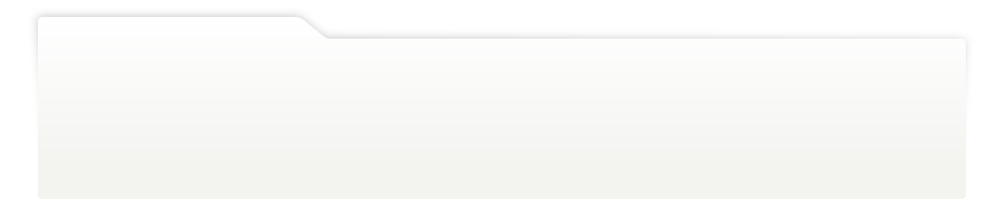
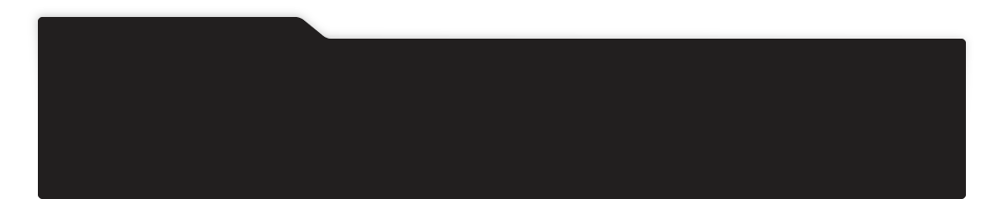
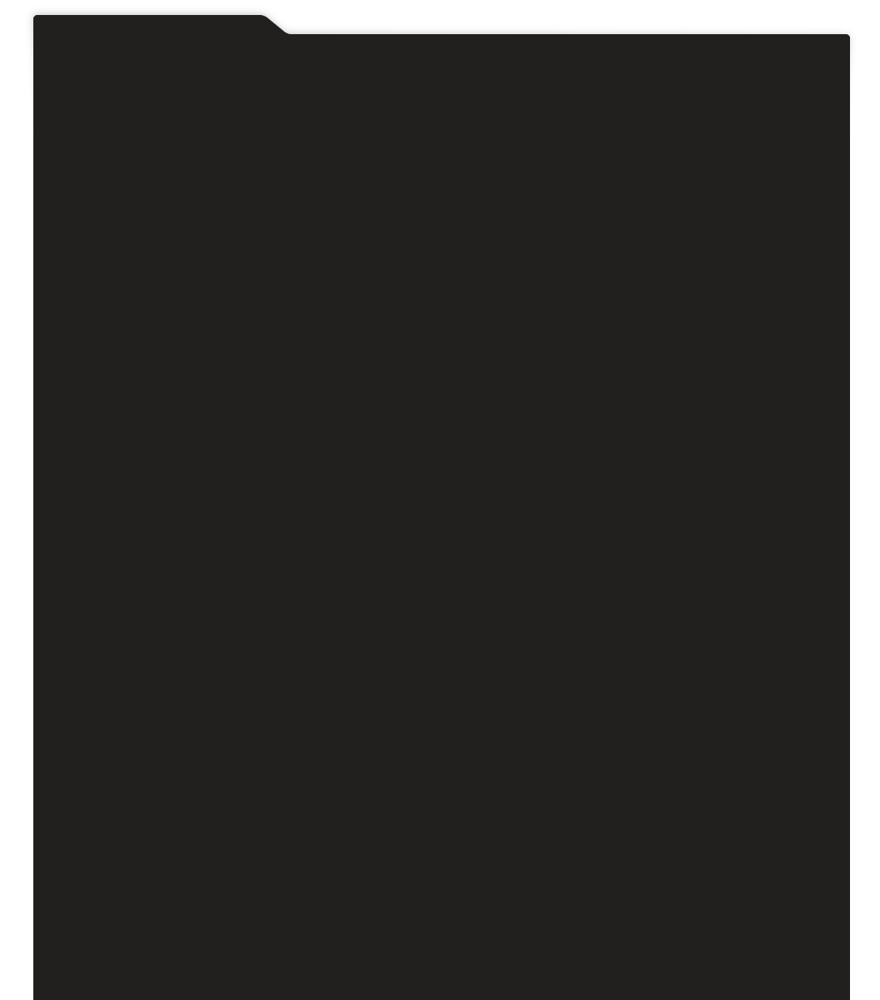
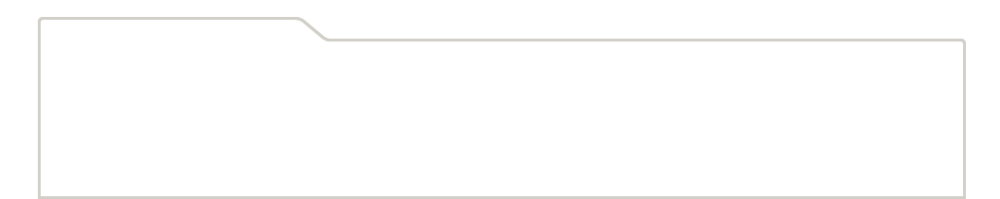
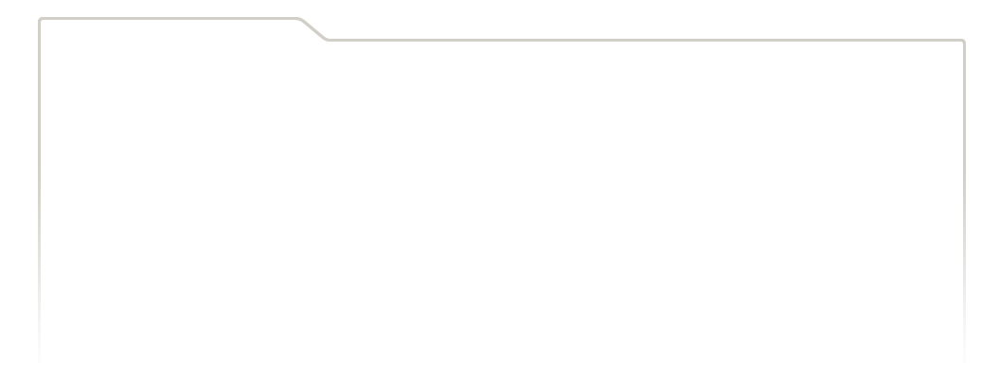
...
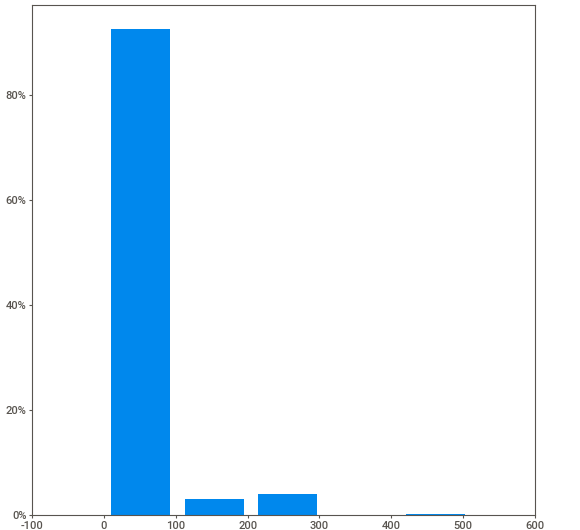
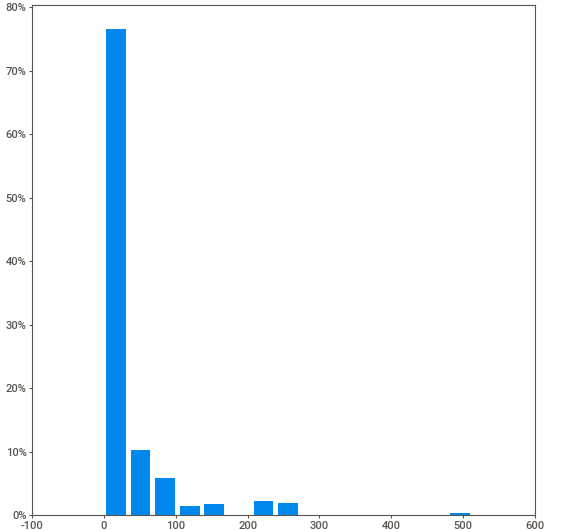
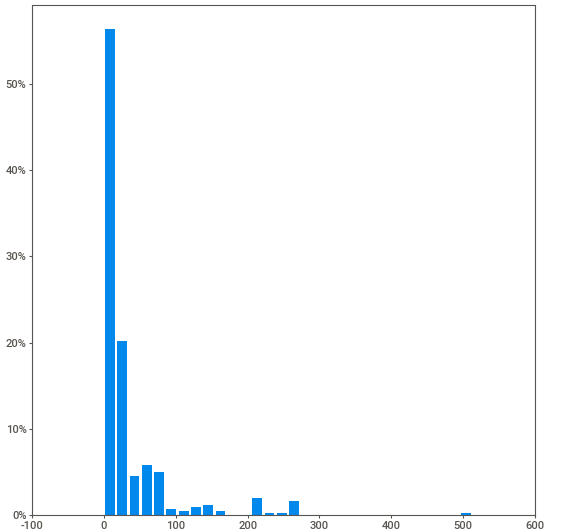
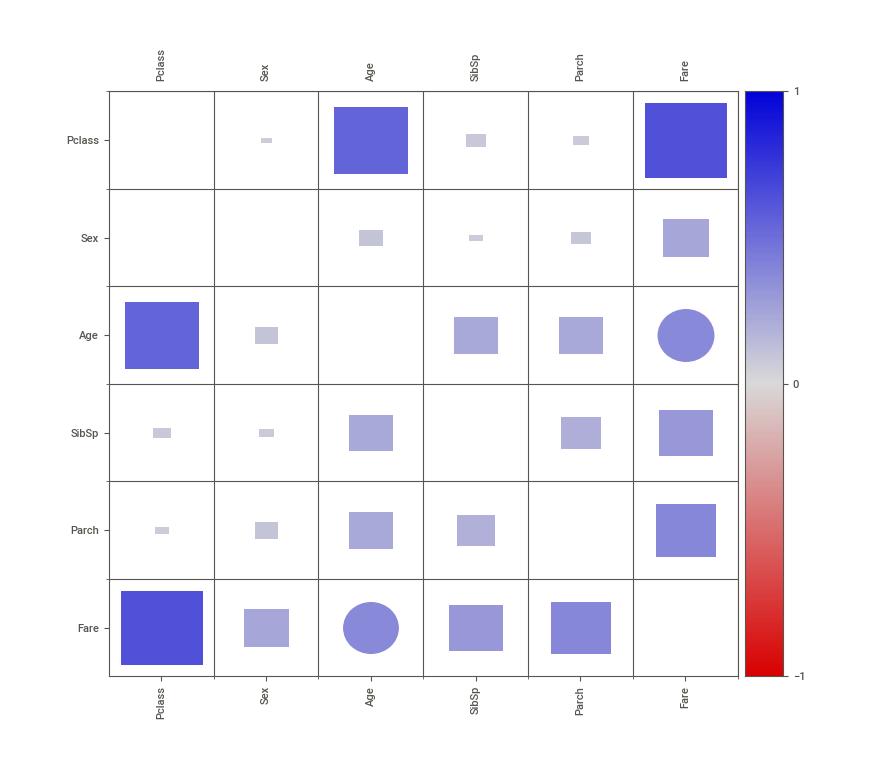
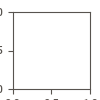

In [ ]:
sv.config_parser.read("Override.ini")
my_report = sv.analyze(data_test3)
my_report.show_html(filepath='Edited_report2.html', layout='vertical', scale=None)
my_report.show_notebook()

In [ ]:
for row in range(len(data_test3['Age'])):
  if np.isnan(data_test3['Age'][row]):
     data_test3['Age'][row] = random.uniform(12.8, 41.2)


data_test3['Fare'] = data_test3['Fare'].fillna(14)

In [ ]:
predictions = model.predict(data_test3.loc[:,:])

predictions

array([0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [ ]:
kaggle_table = data_test2['PassengerId']
kaggle_table

0       892
1       893
2       894
3       895
4       896
       ... 
413    1305
414    1306
415    1307
416    1308
417    1309
Name: PassengerId, Length: 418, dtype: int64

In [ ]:
new_table = np.column_stack((kaggle_table, predictions))
new_table = new_table.astype(int)
new_table

array([[ 892,    0],
       [ 893,    0],
       [ 894,    0],
       [ 895,    0],
       [ 896,    0],
       [ 897,    0],
       [ 898,    1],
       [ 899,    0],
       [ 900,    1],
       [ 901,    0],
       [ 902,    0],
       [ 903,    0],
       [ 904,    1],
       [ 905,    0],
       [ 906,    1],
       [ 907,    1],
       [ 908,    0],
       [ 909,    0],
       [ 910,    1],
       [ 911,    0],
       [ 912,    0],
       [ 913,    0],
       [ 914,    1],
       [ 915,    0],
       [ 916,    1],
       [ 917,    0],
       [ 918,    1],
       [ 919,    0],
       [ 920,    0],
       [ 921,    0],
       [ 922,    0],
       [ 923,    0],
       [ 924,    1],
       [ 925,    0],
       [ 926,    1],
       [ 927,    0],
       [ 928,    0],
       [ 929,    0],
       [ 930,    0],
       [ 931,    0],
       [ 932,    0],
       [ 933,    1],
       [ 934,    0],
       [ 935,    1],
       [ 936,    1],
       [ 937,    0],
       [ 938,    0],
       [ 939,

In [ ]:
#import pandas as pd

#d = pd.DataFrame(new_table)
#d.to_csv("Predictions.csv")


new_table = pd.DataFrame(predictions, columns=['predictions']).to_csv('prediction.csv')

#Cross Validation

In [ ]:
list_x = list(predictions)

In [ ]:
data_test3['Survived'] = list_x
data_test3.head()

,Pclass,Sex,Age,SibSp,Parch,Fare,Survived
0,3,0,34,0,0,8,0
1,3,1,47,1,0,7,0
2,2,0,62,0,0,10,0
3,3,0,27,0,0,9,0
4,3,1,22,1,1,12,0


                                             |          | [  0%]   00:00 -> (? left)


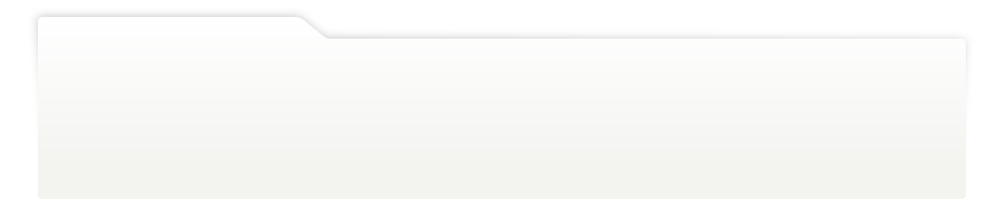
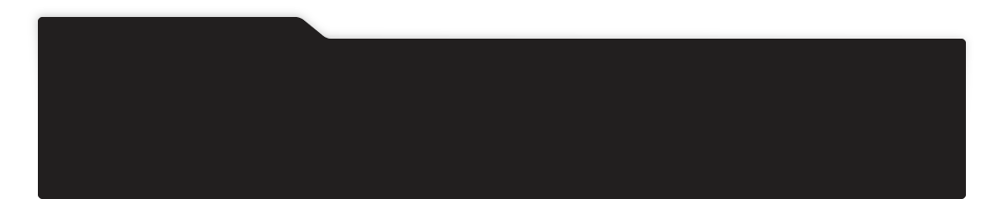
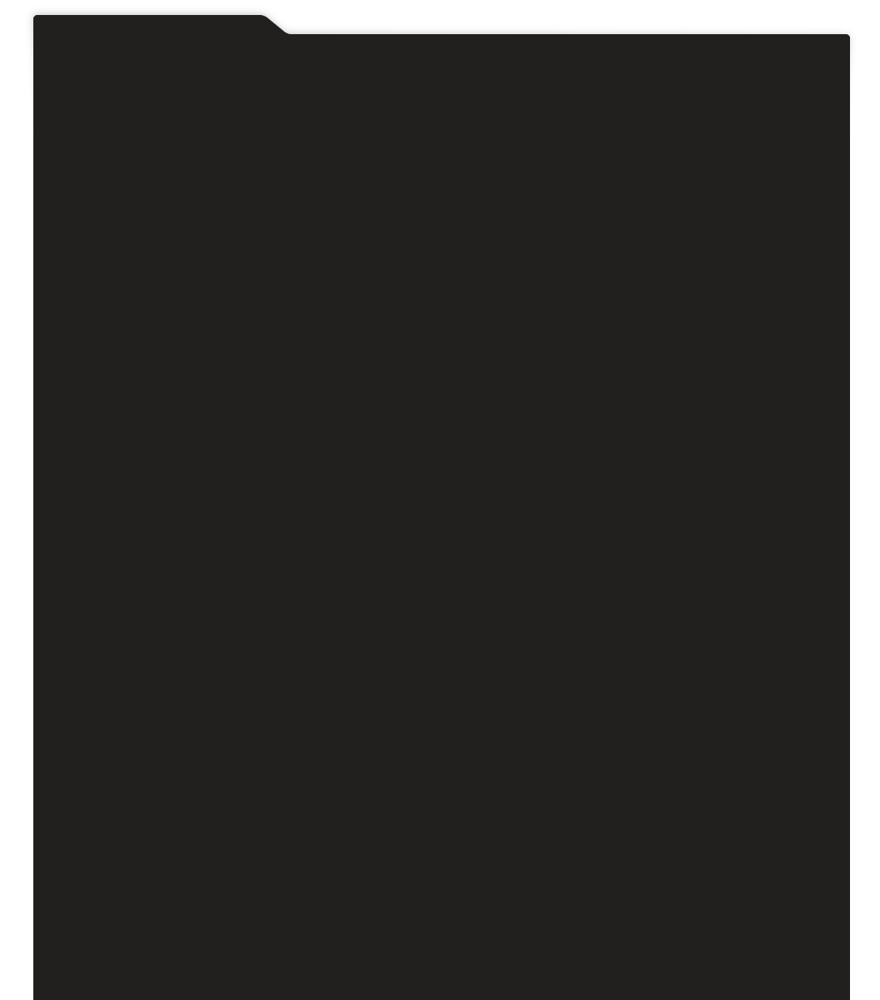
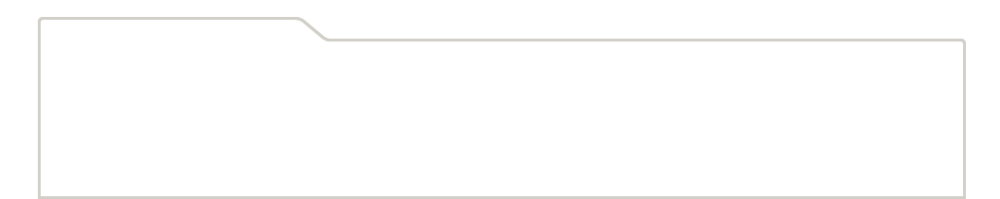
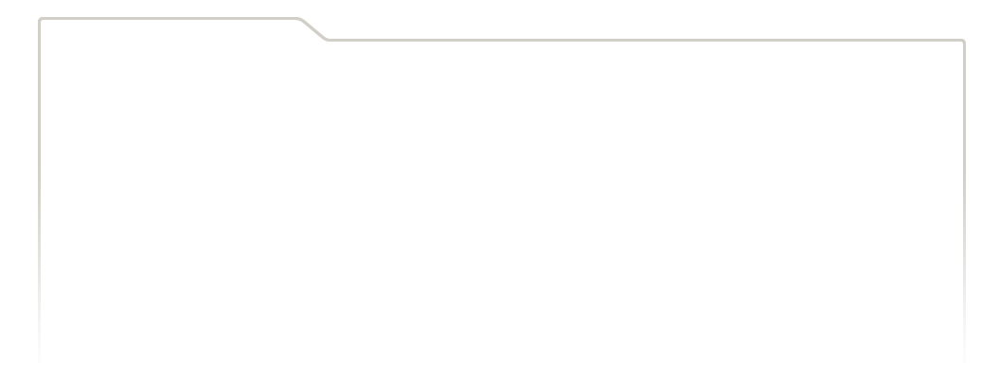
...
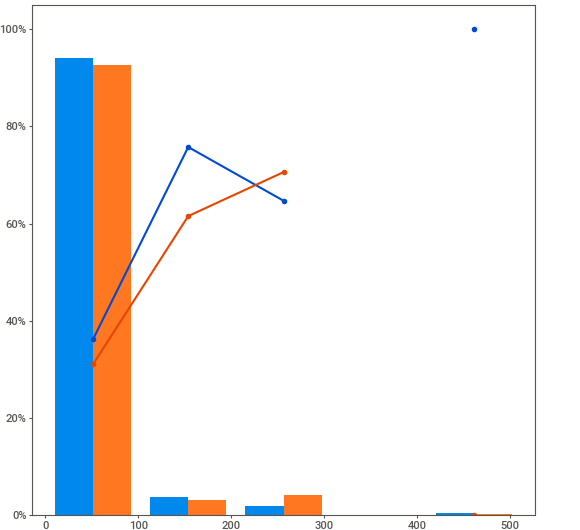
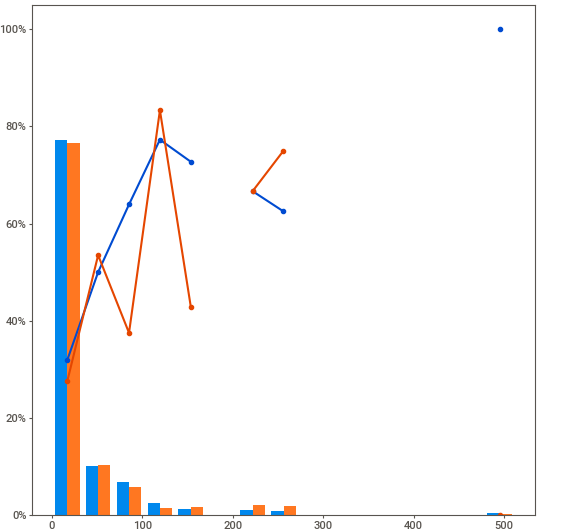
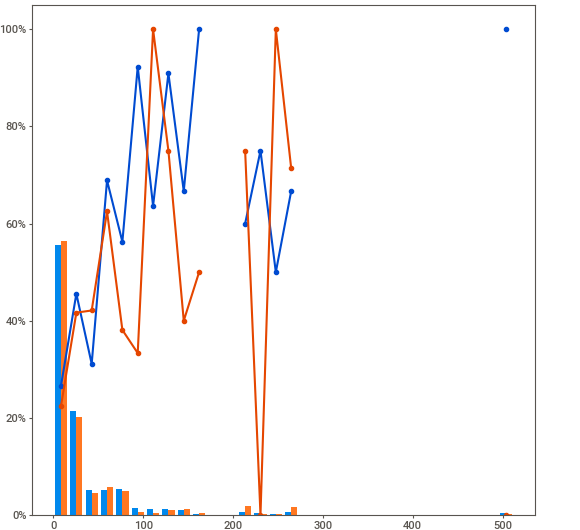
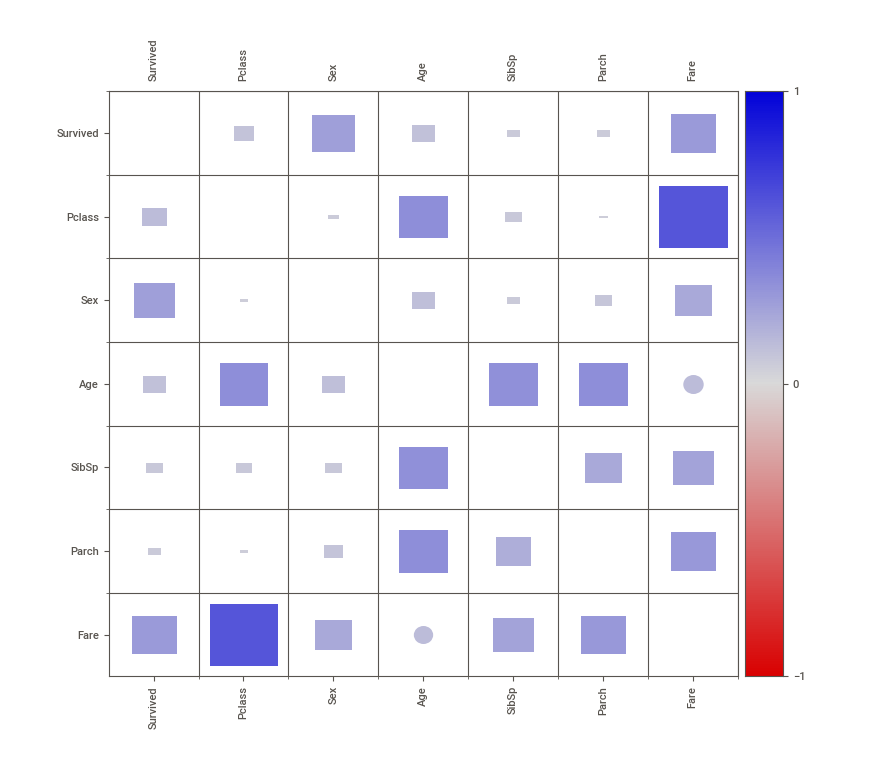
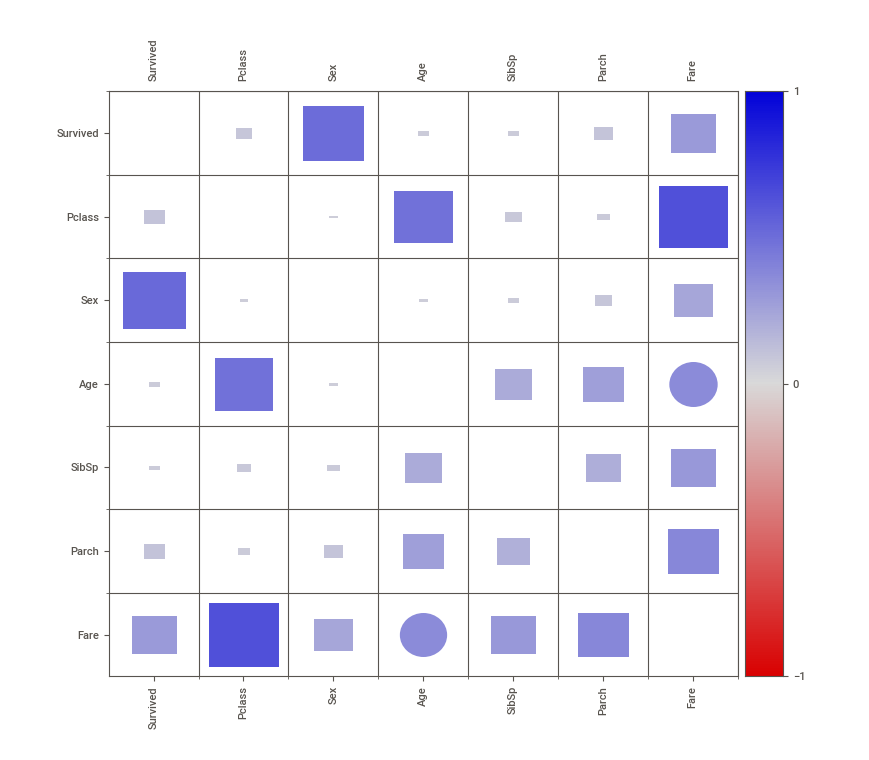

In [ ]:
import sweetviz as sv
comparison_report = sv.compare([data,'Train'],[data_test3,'Test'],target_feat='Survived')
comparison_report.show_notebook()

In [ ]:

import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Load the Titanic dataset
train_df = pd.read_csv('https://drive.google.com/uc?id=17tAp1eNHKRkN6FtITdM-ufxeoV8XQOVM')

# Separate the target variable from the features
X_train = train_df.drop(['Survived'], axis=1)
y_train = train_df['Survived']

# Define the numerical and categorical features
num_features = ['Age', 'Fare', 'SibSp', 'Parch']# ['Age', 'Fare', 'SibSp', 'Parch']
cat_features = ['Sex', 'Pclass']# ['Pclass', 'Sex', 'Embarked']

# Define the preprocessing steps for numerical and categorical features
num_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder())
])

# Combine the numerical and categorical transformers
preprocessor = ColumnTransformer(transformers=[
    ('num', num_transformer, num_features),
    ('cat', cat_transformer, cat_features)
])

# Combine the preprocessing steps and the classifier into a single pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
])

# Fit and transform the training data
X_train_preprocessed = pipeline.fit_transform(X_train)

In [ ]:
pipeline

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age', 'Fare', 'SibSp',
                                                   'Parch']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['Sex', 'Pclass'])]))])

In [ ]:
feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
feature_names

array(['num__Age', 'num__Fare', 'num__SibSp', 'num__Parch',
       'cat__Sex_female', 'cat__Sex_male', 'cat__Pclass_1',
       'cat__Pclass_2', 'cat__Pclass_3'], dtype=object)

In [ ]:
pd.DataFrame(X_train_preprocessed, columns = feature_names)

,num__Age,num__Fare,num__SibSp,num__Parch,cat__Sex_female,cat__Sex_male,cat__Pclass_1,cat__Pclass_2,cat__Pclass_3
0,-1,-1,0,-0,0,1,0,0,1
1,1,1,0,-0,1,0,1,0,0
2,-0,-0,-0,-0,1,0,0,0,1
3,0,0,0,-0,1,0,1,0,0
4,0,-0,-0,-0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...
886,-0,-0,-0,-0,0,1,0,1,0
887,-1,-0,-0,-0,1,0,1,0,0
888,-0,-0,0,2,1,0,0,0,1
889,-0,-0,-0,-0,0,1,1,0,0


In [ ]:
pd.concat([pd.DataFrame(X_train_preprocessed, columns = feature_names),
           X_train['Sex']], axis = 1)

,num__Age,num__Fare,num__SibSp,num__Parch,cat__Sex_female,cat__Sex_male,cat__Pclass_1,cat__Pclass_2,cat__Pclass_3,Sex
0,-1,-1,0,-0,0,1,0,0,1,male
1,1,1,0,-0,1,0,1,0,0,female
2,-0,-0,-0,-0,1,0,0,0,1,female
3,0,0,0,-0,1,0,1,0,0,female
4,0,-0,-0,-0,0,1,0,0,1,male
...,...,...,...,...,...,...,...,...,...,...
886,-0,-0,-0,-0,0,1,0,1,0,male
887,-1,-0,-0,-0,1,0,1,0,0,female
888,-0,-0,0,2,1,0,0,0,1,female
889,-0,-0,-0,-0,0,1,1,0,0,male


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Combine the preprocessing steps and the classifier into a single pipeline
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', XGBClassifier())
])

# Define the hyperparameter space for grid search
# Use 'classifier__' as a prefix to specify parameters for the XGBClassifier
param_grid = {
    'classifier__max_depth': [3, 5, 6, 7],
    'classifier__learning_rate': [0.08, 0.07, 0.06, 0.04, 0.02],
    'classifier__n_estimators': [50, 75, 100],
    'classifier__reg_lambda': [1, 0.75, 0.5, 0.25],
    'classifier__reg_alpha': [1, 0.75, 0.5, 0.25]
}

# Perform grid search to find the best hyperparameters
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters and the corresponding score
print("Best hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

Best hyperparameters:  {'classifier__learning_rate': 0.08, 'classifier__max_depth': 5, 'classifier__n_estimators': 100, 'classifier__reg_alpha': 1, 'classifier__reg_lambda': 0.5}
Best score:  0.8473730462620048


In [ ]:
best_estimator=grid_search.best_estimator_
best_estimator

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['Age', 'Fare', 'SibSp',
                                                   'Parch']),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehot',
                                                                   OneHotEncoder())]),
                                                  ['Sex', 'Pclass'])])),
                ('classifier',
                 XGBClassifier(bas...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=0.08,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=5, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=100, n_jobs=None,
                               num_parallel_tree=None, random_state=None, ...))])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.94      0.89       549
           1       0.88      0.72      0.79       342

    accuracy                           0.86       891
   macro avg       0.86      0.83      0.84       891
weighted avg       0.86      0.86      0.85       891



In [ ]:
xgboost_model = best_estimator.get_params()['classifier']
feature_names = grid_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()

In [ ]:
from sklearn.model_selection import train_test_split
data_raw = pd.read_csv('https://drive.google.com/uc?id=17tAp1eNHKRkN6FtITdM-ufxeoV8XQOVM')
cols = data_raw.columns.tolist()
cols.remove('Survived')
X_train, X_test, y_train, y_test = train_test_split(data_raw.loc[:,cols],
                                                    data_raw.Survived,
                                                    test_size=0.33,
                                                    random_state=42)

                                             |          | [  0%]   00:00 -> (? left)


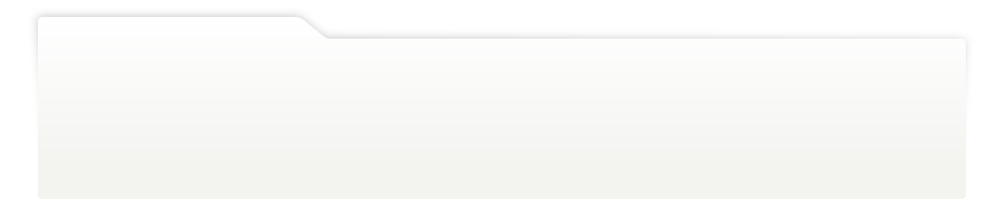
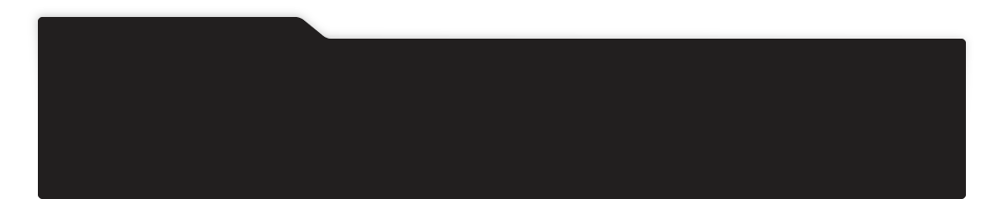
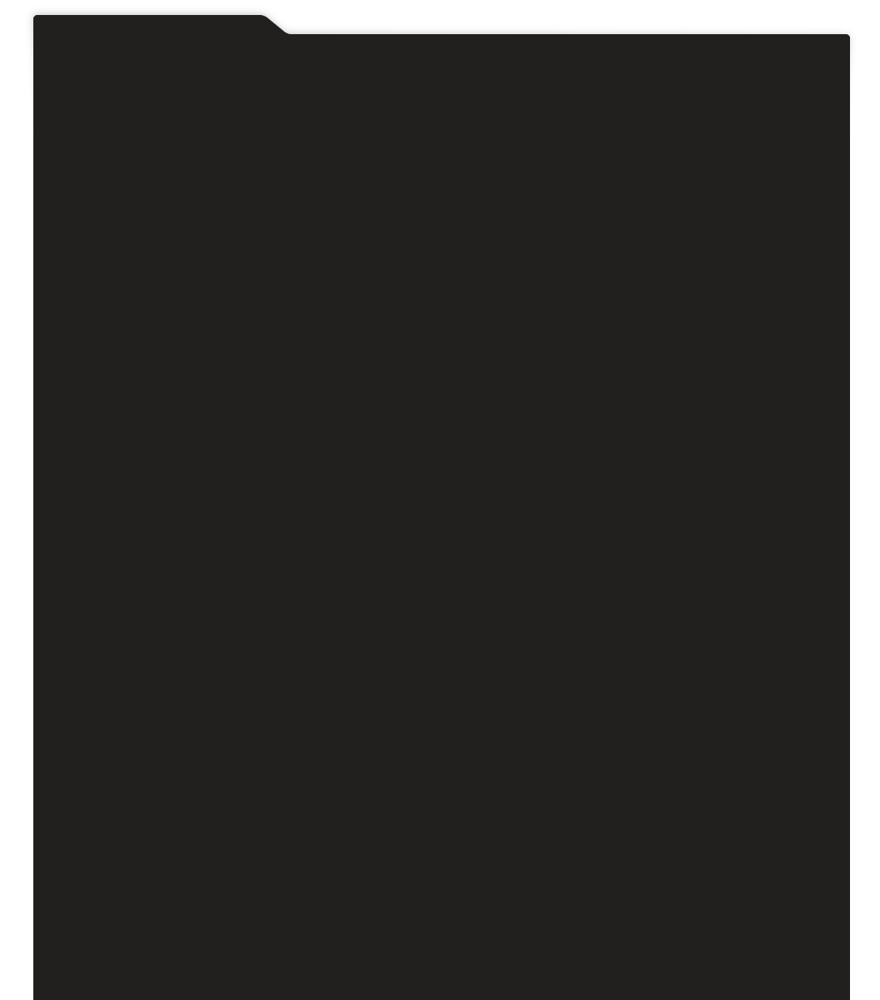
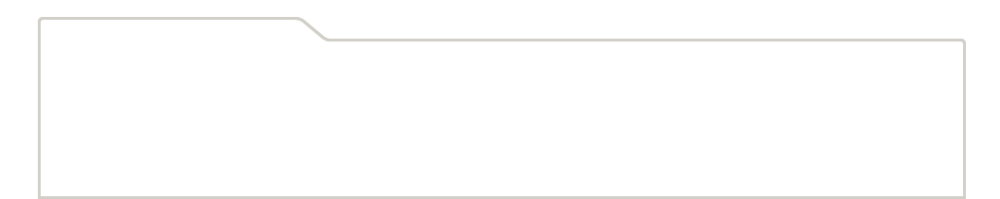
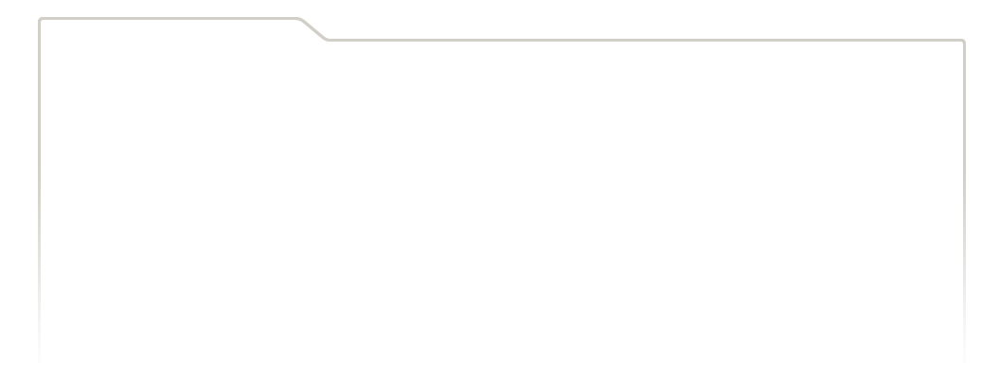
...
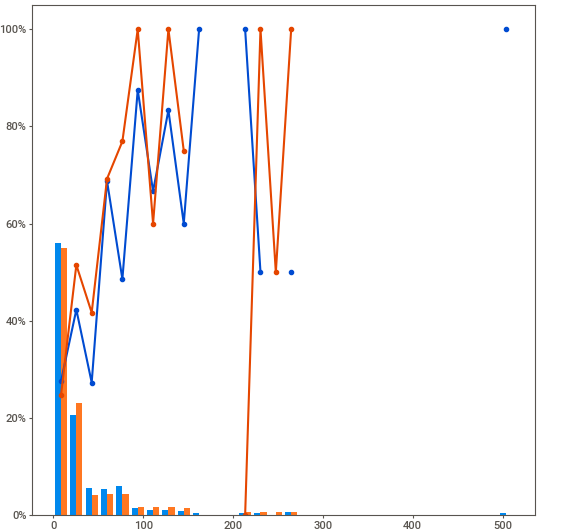
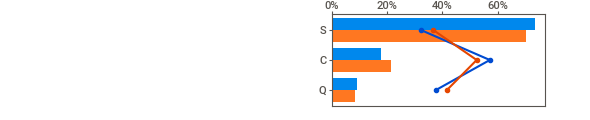
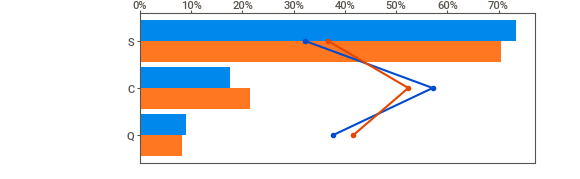
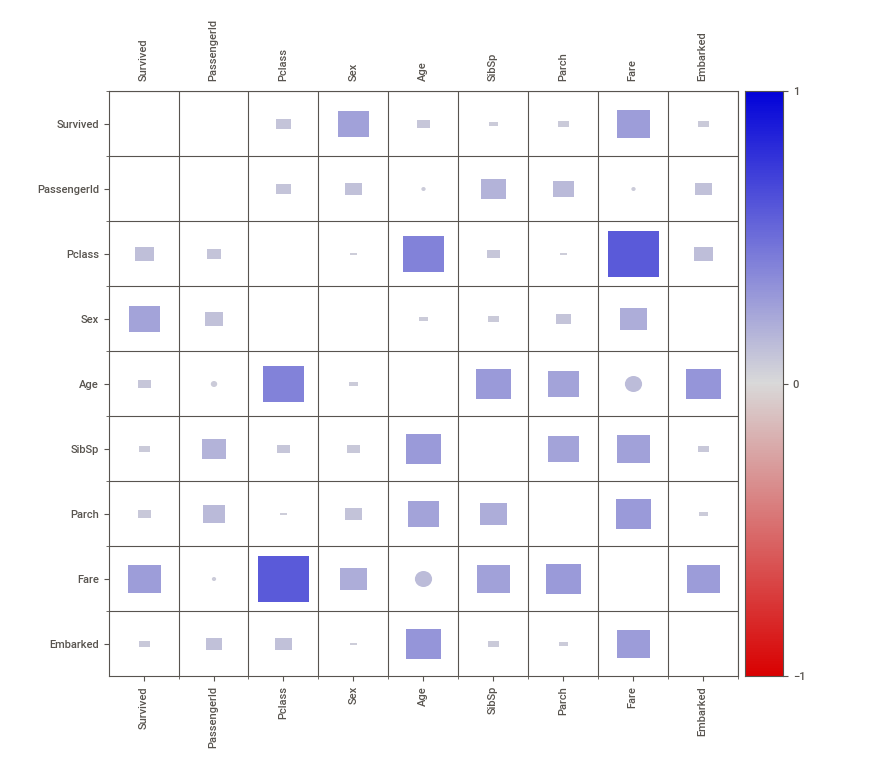
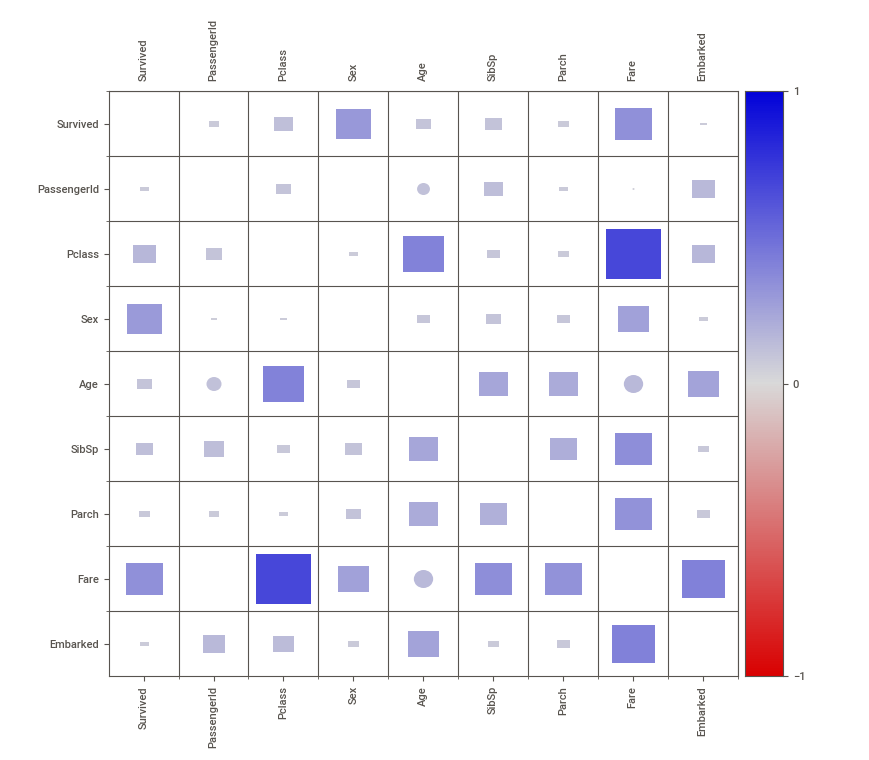

In [ ]:
import sweetviz as sv
comparison_report = sv.compare([pd.concat([X_train, y_train], axis = 1),'Train'],
                               [pd.concat([X_test, y_test], axis = 1),'Test'],
                               target_feat='Survived')
comparison_report.show_notebook()

In [ ]:
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier


data_raw = pd.read_csv('https://drive.google.com/uc?id=17tAp1eNHKRkN6FtITdM-ufxeoV8XQOVM')

data = data_raw.copy().drop(columns = 'Cabin')
data['Age'] = data['Age'].fillna(28)
data['Embarked'] = data['Embarked'].fillna('S')

# Creating an instance of our XGBoost
model = XGBClassifier(reg_alpha=1.0, reg_lambda=0.75, learning_rate=0.08, max_depth=6, n_estimators=75)

scores = cross_val_score(model,
                         data.loc[:, ['Age', 'Fare']],
                         data.Survived, cv=5)

scores

array([0.61452514, 0.70786517, 0.69101124, 0.74157303, 0.70224719])